In [1]:
%pip install wfdb

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import wfdb
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [4]:
import ast

In [5]:
def load_raw_data(df, sampling_rate, path):
    if sampling_rate == 100:
        data = [wfdb.rdsamp(path+f) for f in df.filename_lr]
    else:
        data = [wfdb.rdsamp(path+f) for f in df.filename_hr]
    data = np.array([signal for signal, meta in data])
    return data

In [15]:
path = "/Users/ana.g.orlova/Desktop/1.0.3/"

In [21]:
sampling_rate = 100 

In [16]:
import os

if os.path.exists(path):
    print(f"Путь '{path}' найден!")
else:
    print(f"Путь '{path}' не найден. Проверьте корректность пути.")


Путь '/Users/ana.g.orlova/Desktop/1.0.3/' найден!


In [17]:
try:
    with open(path + 'ptbxl_database.csv', 'r') as file:
        print("Файл открыт успешно.")
except PermissionError as e:
    print(f"Ошибка доступа: {e}")

Файл открыт успешно.


In [ ]:

Y = pd.read_csv(path+'ptbxl_database.csv', index_col='ecg_id') 
Y.scp_codes = Y.scp_codes.apply(lambda x: ast.literal_eval(x))

In [19]:
sample_size = 2
Y_sample = Y.head(sample_size)

In [22]:
#signal data
X_sample = load_raw_data(Y_sample, sampling_rate, path)

#diagnostic aggregation
agg_df = pd.read_csv(path+'scp_statements.csv', index_col=0)
agg_df = agg_df[agg_df.diagnostic == 1]

In [23]:
def aggregate_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key].diagnostic_class)
    return list(set(tmp))

## Visualization

In [20]:
Y_sample['diagnostic_superclass'] = Y_sample.scp_codes.apply(aggregate_diagnostic)

/var/folders/yh/__krj9vj03703dshgqrk6hqm0000gn/T/ipykernel_8075/3155120567.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_sample['diagnostic_superclass'] = Y_sample.scp_codes.apply(aggregate_diagnostic)


In [18]:
import matplotlib.pyplot as plt

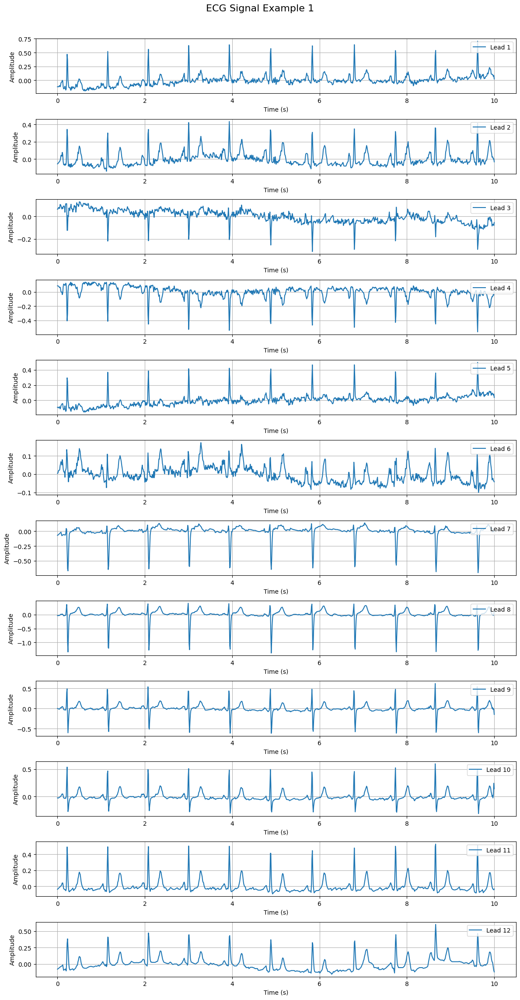

In [19]:
def plot_ecg(signal, sampling_rate, title="ECG Signal", leads=12):

    time = np.linspace(0, signal.shape[0] / sampling_rate, signal.shape[0])

    plt.figure(figsize=(12, 2 * leads))
    for i in range(leads):
        plt.subplot(leads, 1, i + 1)
        plt.plot(time, signal[:, i], label=f"Lead {i+1}")
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.legend(loc="upper right")
        plt.grid()
    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()

example_index = 0
example_signal = X_sample[example_index]

plot_ecg(example_signal, sampling_rate, title=f"ECG Signal Example {example_index+1}")

## Dataframe for training 

In [25]:
import pandas as pd
import numpy as np
import os
import ast

base_path = "/Users/ana.g.orlova/Desktop/1.0.3/"
records_path = os.path.join(base_path, "records500")
database_path = os.path.join(base_path, "ptbxl_database.csv")
scp_statements_path = os.path.join(base_path, "scp_statements.csv")

Y = pd.read_csv(database_path, index_col='ecg_id')
Y['scp_codes'] = Y['scp_codes'].apply(ast.literal_eval) 

agg_df = pd.read_csv(scp_statements_path, index_col=0)
agg_df = agg_df[agg_df['diagnostic'] == 1]  

def aggregate_diagnostic(y_dic):
    tmp = []
    for key in y_dic.keys():
        if key in agg_df.index:
            tmp.append(agg_df.loc[key]['diagnostic_class'])
    return list(set(tmp))

Y['diagnostic_superclass'] = Y['scp_codes'].apply(aggregate_diagnostic)

def get_record_path(filename, records_path):
    return os.path.join(records_path, filename + ".hea")


#Y['path_to_record'] = Y['filename_lr'].apply(lambda x: get_record_path(x, records_path))
Y['path_to_record'] = Y['filename_lr'].apply(lambda x: os.path.join(base_path, x))


diagnosis_dummies = Y['diagnostic_superclass'].explode().str.get_dummies().groupby(level=0).max()


df = pd.concat([Y[['path_to_record']], diagnosis_dummies], axis=1)


print(df.head())


                                           path_to_record  CD  HYP  MI  NORM  \
ecg_id                                                                         
1       /Users/ana.g.orlova/Desktop/1.0.3/records100/0...   0    0   0     1   
2       /Users/ana.g.orlova/Desktop/1.0.3/records100/0...   0    0   0     1   
3       /Users/ana.g.orlova/Desktop/1.0.3/records100/0...   0    0   0     1   
4       /Users/ana.g.orlova/Desktop/1.0.3/records100/0...   0    0   0     1   
5       /Users/ana.g.orlova/Desktop/1.0.3/records100/0...   0    0   0     1   

        STTC  
ecg_id        
1          0  
2          0  
3          0  
4          0  
5          0  


In [26]:
sum = np.sum(df['NORM'])
sum

np.int64(9514)

In [27]:
sum = np.sum(df['CD'])
sum

np.int64(4898)

In [29]:
def load_ecg_signal(record_path):
    try:
        record = wfdb.rdrecord(record_path) 
        signal = record.p_signal[:, 0]       
        return signal
    except Exception as e:
        print(f"Ошибка при загрузке записи {record_path}: {e}")
        return None


In [30]:
X = []
y = []

for _, row in df.iterrows():
    try:
        record = wfdb.rdrecord(row['path_to_record'])
        
        signal = record.p_signal
        
        X.append(signal)
        
        y.append(row[['CD', 'HYP', 'MI', 'NORM', 'STTC']].values.astype(int))
    except Exception as e:
        print(f"Ошибка при чтении файла {row['path_to_record']}: {e}")


X = np.array(X) 
y = np.array(y) 


print(f"Размерность X: {X.shape}")
print(f"Размерность y: {y.shape}")


Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04862_lr: [Errno 2] No such file or directory: '/Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04862_lr.hea'
Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04863_lr: [Errno 2] No such file or directory: '/Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04863_lr.hea'
Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04864_lr: [Errno 2] No such file or directory: '/Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04864_lr.hea'
Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04865_lr: [Errno 2] No such file or directory: '/Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04865_lr.hea'
Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04866_lr: [Errno 2] No such file or directory: '/Users/ana.g.orlova/Desktop/1.0.3/records100/04000/04866_lr.hea'
Ошибка при чтении файла /Users/ana.g.orlova/Desktop/1.0.3/re

## Dataset

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import numpy as np


In [32]:
import torch.nn.functional as F


In [33]:
pip install iterstrat.ml_stratifiers

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement iterstrat.ml_stratifiers (from versions: none)
ERROR: No matching distribution found for iterstrat.ml_stratifiers
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [34]:
pip install iterative-stratification

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from iterstrat.ml_stratifiers import MultilabelStratifiedKFold
import numpy as np

# stratification
skf = MultilabelStratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# generating indexes for split
for train_index, test_index in skf.split(X, y):
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    break  # taking only one split

print(f"Размерность X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"Размерность y_train: {y_train.shape}, y_test: {y_test.shape}")

Размерность X_train: (3228, 1000, 12), X_test: (1614, 1000, 12)
Размерность y_train: (3228, 5), y_test: (1614, 5)


In [ ]:
from torch.utils.data import Dataset
import torch

class ECGDataset(Dataset):
    def __init__(self, signals, labels):
        """
        Args:
            signals: numpy array или torch.Tensor формы [N, 1000, 12] (time, channels)
            labels: numpy array или torch.Tensor формы [N, num_classes]
        """
        self.signals = torch.tensor(signals, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.float32)

    def __len__(self):
        return len(self.signals)

    def __getitem__(self, idx):
        x = self.signals[idx]        # [1000, 12]
        y = self.labels[idx]         # [num_classes]
        x = x.permute(1, 0)          # → [12, 1000] — for Conv1d
        return x, y
    
# Создаём стратифицированное разбиение
skf = MultilabelStratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Генерируем индексы для разбиения
for train_index, test_val_index in skf.split(X, y):
    X_train, X_test_val = X[train_index], X[test_val_index]
    y_train, y_test_val = y[train_index], y[test_val_index]
    break  # Берем только одно разбиение

# Разделяем test_val на валидацию и тест (50/50)
skf_val_test = MultilabelStratifiedKFold(n_splits=2, shuffle=True, random_state=42)
for val_index, test_index in skf_val_test.split(X_test_val, y_test_val):
    X_val, X_test = X_test_val[val_index], X_test_val[test_index]
    y_val, y_test = y_test_val[val_index], y_test_val[test_index]
    break

print(f"Размерность X_train: {X_train.shape}, X_val: {X_val.shape}, X_test: {X_test.shape}")
print(f"Размерность y_train: {y_train.shape}, y_val: {y_val.shape}, y_test: {y_test.shape}")

# Создаём датасеты
train_dataset = ECGDataset(X_train, y_train)
val_dataset = ECGDataset(X_val, y_val)
test_dataset = ECGDataset(X_test, y_test)

# Создаём DataLoader'ы
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Проверяем размерность одного батча
data_iter = iter(train_loader)
inputs, labels = next(data_iter)

print(inputs.shape)  # torch.Size([32, 12, 1000])

Размерность X_train: (3228, 1000, 12), X_val: (807, 1000, 12), X_test: (807, 1000, 12)
Размерность y_train: (3228, 5), y_val: (807, 5), y_test: (807, 5)
torch.Size([32, 12, 1000])


In [48]:
train_dataset = ECGDataset(X_train, y_train)
test_dataset = ECGDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
data_iter = iter(train_loader)
inputs, labels = next(data_iter)


print(inputs.shape)  # torch.Size([32, 12, 1000])

torch.Size([32, 12, 1000])


In [ ]:
from torch.utils.data import Dataset, DataLoader
import numpy as np

class ECGDataset(Dataset):
    def __init__(self, signals, labels):
        self.signals = torch.tensor(signals, dtype=torch.float32)  # shape: [N, 12, L]
        self.labels = torch.tensor(labels, dtype=torch.float32)    # shape: [N, 71]

    def __len__(self):
        return len(self.signals)

    def __getitem__(self, idx):
        return self.signals[idx], self.labels[idx]

#  X_train, y_train, X_val, y_val 
train_dataset = ECGDataset(X_train, y_train)
val_dataset = ECGDataset(X_val, y_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

## Proto Net

In [ ]:
# Re-executing full code after kernel reset

import torch
import torch.nn as nn
import torch.nn.functional as F

# ===  ProtoECGNet with Residual Encoder ===

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=5, stride=1):
        super().__init__()
        self.conv1 = nn.Conv1d(in_channels, out_channels, kernel_size, stride, padding=kernel_size // 2)
        self.bn1 = nn.BatchNorm1d(out_channels)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv1d(out_channels, out_channels, kernel_size, stride, padding=kernel_size // 2)
        self.bn2 = nn.BatchNorm1d(out_channels)
        self.shortcut = nn.Conv1d(in_channels, out_channels, 1) if in_channels != out_channels else nn.Identity()

    def forward(self, x):
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        return self.relu(out)

class ECGEncoderResNet(nn.Module):
    def __init__(self, input_channels=12, embedding_dim=256):
        super().__init__()
        self.layer1 = ResidualBlock(input_channels, 64)
        self.layer2 = ResidualBlock(64, 128)
        self.layer3 = ResidualBlock(128, embedding_dim)
        self.pool = nn.AdaptiveAvgPool1d(1)

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.pool(x).squeeze(-1)
        return x

class ProtoECGNet(nn.Module):
    def __init__(self, encoder, num_classes=71, prototypes_per_class=2, embedding_dim=256):
        super().__init__()
        self.encoder = encoder
        self.num_classes = num_classes
        self.prototypes_per_class = prototypes_per_class
        self.embedding_dim = embedding_dim
        self.num_prototypes = num_classes * prototypes_per_class

        self.prototypes = nn.Parameter(torch.randn(self.num_prototypes, embedding_dim))
        self.classification_head = nn.Sequential(
            nn.LayerNorm(embedding_dim),
            nn.Linear(embedding_dim, num_classes)
        )

    def forward(self, x):
        z = self.encoder(x)
        logits = self.classification_head(z)
        dists = torch.cdist(z, self.prototypes)
        return logits, dists, z

def prototype_loss(z, dists, target_labels, prototypes, num_classes, prototypes_per_class):
    loss = 0.0
    batch_size = z.size(0)
    for i in range(batch_size):
        for cls in range(num_classes):
            if target_labels[i, cls] > 0:
                proto_idx = cls * prototypes_per_class  # use first prototype for simplicity
                loss += F.mse_loss(z[i], prototypes[proto_idx])
    return loss / batch_size

def contrastive_loss(z, y, margin=1.0):
    batch_size = z.size(0)
    loss = 0.0
    for i in range(batch_size):
        for j in range(batch_size):
            if i == j:
                continue
            sim = F.cosine_similarity(z[i].unsqueeze(0), z[j].unsqueeze(0))
            if torch.equal(y[i], y[j]):
                loss += 1 - sim
            else:
                loss += F.relu(sim - margin)
    return loss / (batch_size ** 2)

def train_model(model, train_loader, val_loader, num_epochs=10, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCEWithLogitsLoss()

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for x_batch, y_batch in train_loader:
            x_batch, y_batch = x_batch.to(device), y_batch.to(device).float()
            logits, dists, z = model(x_batch)

            loss_bce = criterion(logits, y_batch)
            loss_proto = prototype_loss(z, dists, y_batch, model.prototypes, model.num_classes, model.prototypes_per_class)
            loss_contrast = contrastive_loss(z, y_batch)

            loss = loss_bce + 0.1 * loss_proto + 0.1 * loss_contrast

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        print(f"Epoch {epoch + 1}, Train Loss: {total_loss:.4f}")
        evaluate_model(model, val_loader, device)

def evaluate_model(model, val_loader, device="cuda"):
    model.eval()
    y_true, y_pred = [], []
    with torch.no_grad():
        for x_batch, y_batch in val_loader:
            x_batch = x_batch.to(device)
            logits, _, _ = model(x_batch)
            preds = torch.sigmoid(logits).cpu().numpy()
            y_pred.append(preds)
            y_true.append(y_batch.numpy())

    import numpy as np
    from sklearn.metrics import average_precision_score, roc_auc_score

    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)
    ap = average_precision_score(y_true, y_pred, average="macro")
    roc = roc_auc_score(y_true, y_pred, average="macro")
    print(f"Validation AP: {ap:.4f}, ROC AUC: {roc:.4f}")



In [52]:



num_classes = 5
prototypes_per_class = 2
embedding_dim = 256
num_epochs = 20
learning_rate = 1e-3
device = "cuda" if torch.cuda.is_available() else "cpu"


encoder = ECGEncoderResNet(input_channels=12, embedding_dim=embedding_dim)
model = ProtoECGNet(
    encoder=encoder,
    num_classes=num_classes,
    prototypes_per_class=prototypes_per_class,
    embedding_dim=embedding_dim
)


train_model(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    lr=learning_rate,
    device=device
)


Epoch 1, Train Loss: 51.7143
Validation AP: 0.6487, ROC AUC: 0.8412
Epoch 2, Train Loss: 43.6914
Validation AP: 0.7016, ROC AUC: 0.8687
Epoch 3, Train Loss: 39.7933
Validation AP: 0.6984, ROC AUC: 0.8583
Epoch 4, Train Loss: 37.1460
Validation AP: 0.7369, ROC AUC: 0.8825
Epoch 5, Train Loss: 35.1534
Validation AP: 0.7224, ROC AUC: 0.8787
Epoch 6, Train Loss: 33.5962
Validation AP: 0.7279, ROC AUC: 0.8827
Epoch 7, Train Loss: 32.0337
Validation AP: 0.7320, ROC AUC: 0.8859
Epoch 8, Train Loss: 31.3487
Validation AP: 0.7302, ROC AUC: 0.8804
Epoch 9, Train Loss: 30.3428
Validation AP: 0.7363, ROC AUC: 0.8846
Epoch 10, Train Loss: 29.3641
Validation AP: 0.7445, ROC AUC: 0.8933
Epoch 11, Train Loss: 27.7510
Validation AP: 0.7487, ROC AUC: 0.8920
Epoch 12, Train Loss: 27.3908
Validation AP: 0.7442, ROC AUC: 0.8917
Epoch 13, Train Loss: 26.6942
Validation AP: 0.7406, ROC AUC: 0.8917
Epoch 14, Train Loss: 26.1740
Validation AP: 0.7498, ROC AUC: 0.8964
Epoch 15, Train Loss: 25.0588
Validation AP

In [74]:
def evaluate_all_metrics_multilabel(model, test_loader, num_classes=5, device="cpu", class_names=None):
    from sklearn.metrics import (
        accuracy_score, f1_score, precision_score, recall_score,
        roc_auc_score, average_precision_score, log_loss
    )
    import numpy as np
    import pandas as pd
    import warnings

    warnings.filterwarnings("ignore", category=UserWarning)

    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs, _, _ = model(inputs)
            probs = torch.sigmoid(outputs)
            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())

    y_true = torch.cat(all_targets).numpy()
    y_probs = torch.cat(all_probs).numpy()
    y_pred = (y_probs >= 0.5).astype(int)

    # === Macro average metrics ===
    print(" Accuracy (subset exact match):", accuracy_score(y_true, y_pred))
    print(" F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print(" Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print(" Recall (macro):", recall_score(y_true, y_pred, average='macro'))
    print(" Log Loss (overall):", log_loss(y_true, y_probs))

    # === Per-class metrics ===
    if class_names is None:
        class_names = [f"Class {i}" for i in range(num_classes)]

    per_class = {
        "Class": [],
        "F1 Score": [],
        "Average Precision": [],
        "ROC AUC": []
    }

    for i in range(num_classes):
        y_t = y_true[:, i]
        y_p = y_pred[:, i]
        y_prob = y_probs[:, i]

        try:
            f1 = f1_score(y_t, y_p, zero_division=0)
            ap = average_precision_score(y_t, y_prob)
            auc = roc_auc_score(y_t, y_prob)
        except ValueError:
            f1, ap, auc = np.nan, np.nan, np.nan

        per_class["Class"].append(class_names[i])
        per_class["F1 Score"].append(f1)
        per_class["Average Precision"].append(ap)
        per_class["ROC AUC"].append(auc)

    df = pd.DataFrame(per_class)
    print("\nPer-class metrics:")
    print(df.to_string(index=False))
    return df


In [75]:
evaluate_all_metrics_multilabel(model, test_loader, num_classes=5, device="cpu")

 Accuracy (subset exact match): 0.6183395291201983
 F1 Score (macro): 0.7116787393155733
 Precision (macro): 0.7671528149361971
 Recall (macro): 0.6742995795389541
 Log Loss (overall): 0.8561624271027977

Per-class metrics:
  Class  F1 Score  Average Precision  ROC AUC
Class 0  0.756757           0.816930 0.894646
Class 1  0.607595           0.686636 0.922428
Class 2  0.621723           0.714727 0.891341
Class 3  0.854762           0.926730 0.927290
Class 4  0.717557           0.776302 0.922003


,Class,F1 Score,Average Precision,ROC AUC
0,Class 0,0.756757,0.816930,0.894646
1,Class 1,0.607595,0.686636,0.922428
2,Class 2,0.621723,0.714727,0.891341
3,Class 3,0.854762,0.926730,0.927290
4,Class 4,0.717557,0.776302,0.922003


## GRAD-CAM 

In [154]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

class GradCAM1D:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        for name, module in self.model.encoder.named_modules():
            if name == self.target_layer:
                module.register_forward_hook(self._forward_hook)
                module.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.activations = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        logits, _, _ = self.model(input_tensor)  # [B, C]
        self.model.zero_grad()

        # calculating gradient by logit class
        target = logits[:, class_idx]
        target.backward()

        # Grad-CAM
        pooled_gradients = torch.mean(self.gradients, dim=2)  # [B, C]
        cam = torch.sum(self.activations * pooled_gradients.unsqueeze(-1), dim=1)  # [B, T]
        cam = F.relu(cam)
        cam = cam.squeeze().cpu().numpy()

        # normalization
        cam -= np.min(cam)
        cam /= np.max(cam) + 1e-6
        return cam


In [97]:
# MI 
mi_class_idx = 2


for x_batch, y_batch in val_loader:
    for i in range(x_batch.shape[0]):
        if y_batch[i, mi_class_idx] == 1:  # found example with MI
            example_ecg = x_batch[i].unsqueeze(0).to(device)
            break
    else:
        continue
    break  


In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
import numpy as np

def visualize_gradcam_multilead_colormap(ecg_tensor, cam, fs=100, title="Grad-CAM + Multilead ECG"):
    """
    ecg_tensor: [1, 12, T]
    cam: [T] — Grad-CAM attention map (by time)
    """
    ecg = ecg_tensor.squeeze(0).cpu().numpy()  # [12, T]
    time = np.arange(ecg.shape[1]) / fs

    # Normalizing CAM от 0 до 1
    cam = cam - np.min(cam)
    cam = cam / (np.max(cam) + 1e-6)

    cmap = get_cmap("Reds")
    norm = Normalize(vmin=0, vmax=1)
    rgba_colors = cmap(norm(cam))  # [T, 4] — RGBA

    plt.figure(figsize=(14, 8))
    for i in range(12):
        offset = (12 - i - 1) * 2
        signal = ecg[i] + offset

        # colormap Grad-CAM
        plt.imshow(
            rgba_colors[np.newaxis, :, :],
            aspect="auto",
            extent=[time[0], time[-1], offset - 0.5, offset + 1.0],
            alpha=0.9,
        )

        # graph of a signal
        plt.plot(time, signal, color='black', linewidth=0.8)
        plt.text(-0.5, offset + 0.5, f"Lead {i+1}", fontsize=8)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.xlim(time[0], time[-1])
    plt.ylim(-1, 2 * 12 + 1)
    plt.tight_layout()
    plt.show()


/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2127609597.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("Reds")


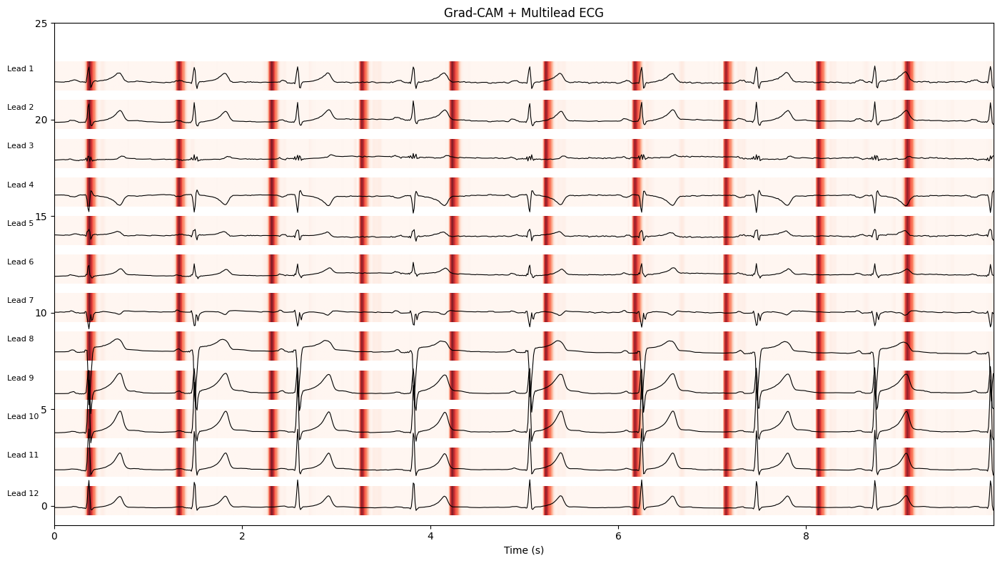

In [99]:
visualize_gradcam_multilead_colormap(example_ecg, cam)

In [91]:
print("CAM stats:", np.min(cam), np.max(cam), np.mean(cam))


CAM stats: 0.0 0.9999803 0.07348254


### evaluation of grad-cam

In [189]:
def evaluate_gradcam_metrics(model, input_tensor, target_class, gradcam_instance, gt_mask=None, threshold=0.9):
    """
    gradcam_instance: объект GradCAM1D
     Delete/Insert curves.
    """
    # === 1.  CAM map ===
    cam = gradcam_instance.generate_cam(input_tensor, target_class)  # [T]
    T = cam.shape[0]
    cam_norm = (cam - np.min(cam)) / (np.max(cam) + 1e-8)

    # === 2. Energy@10% ===
    sorted_cam = np.sort(cam_norm)[::-1]
    k = int(T * 0.1)
    energy_top10 = sorted_cam[:k].sum() / sorted_cam.sum()

    # === 3. Delete/Insert AUC ===
    def compute_auc(mode="delete", step=0.1):
        indices = np.argsort(cam_norm)[::-1].copy()
        mask = torch.ones_like(input_tensor) if mode == 'delete' else torch.zeros_like(input_tensor)
        scores = []

        for r in np.arange(0, 1.01, step):
            k = int(T * r)
            if mode == 'delete':
                mask[:, :, indices[:k]] = 0
            else:
                mask = torch.zeros_like(input_tensor)
                mask[:, :, indices[:k]] = 1
            modified = input_tensor * mask
            logits, _, _ = model(modified)
            scores.append(logits[0, target_class].item())

        return np.trapz(scores, dx=step)

    delete_auc = compute_auc("delete")
    insert_auc = compute_auc("insert")

    # === 4. Visualization Delete/Insert ===
    def plot_di_curves():
        plt.figure(figsize=(10, 4))
        for mode in ['delete', 'insert']:
            indices = np.argsort(cam_norm)[::-1].copy()
            mask = torch.ones_like(input_tensor) if mode == 'delete' else torch.zeros_like(input_tensor)
            scores = []

            for r in np.arange(0, 1.01, 0.1):
                k = int(T * r)
                if mode == 'delete':
                    mask[:, :, indices[:k]] = 0
                else:
                    mask = torch.zeros_like(input_tensor)
                    mask[:, :, indices[:k]] = 1
                modified = input_tensor * mask
                logits, _, _ = model(modified)
                scores.append(logits[0, target_class].item())

            x = np.linspace(0, 1, len(scores))
            plt.plot(x, scores, label=f"{mode.capitalize()}")

        plt.title(f"Grad-CAM Delete/Insert curves (class {target_class})")
        plt.xlabel("Fraction of Time")
        plt.ylabel("Model Score")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    plot_di_curves()

    # === 5. GT mask comparison (optional) ===
    iou = dice = None
    if gt_mask is not None:
        cam_bin = cam_norm >= threshold
        intersection = np.logical_and(cam_bin, gt_mask).sum()
        union = np.logical_or(cam_bin, gt_mask).sum()
        iou = intersection / (union + 1e-8)
        dice = 2 * intersection / (cam_bin.sum() + gt_mask.sum() + 1e-8)
        print(f"IoU: {iou:.3f}, Dice: {dice:.3f}")

    
    metrics = {
        "Energy@10%": energy_top10,
        "Delete AUC": delete_auc,
        "Insert AUC": insert_auc,
    }
    if gt_mask is not None:
        metrics["IoU"] = iou
        metrics["Dice"] = dice

    return metrics


/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2587388067.py:33: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return np.trapz(scores, dx=step)


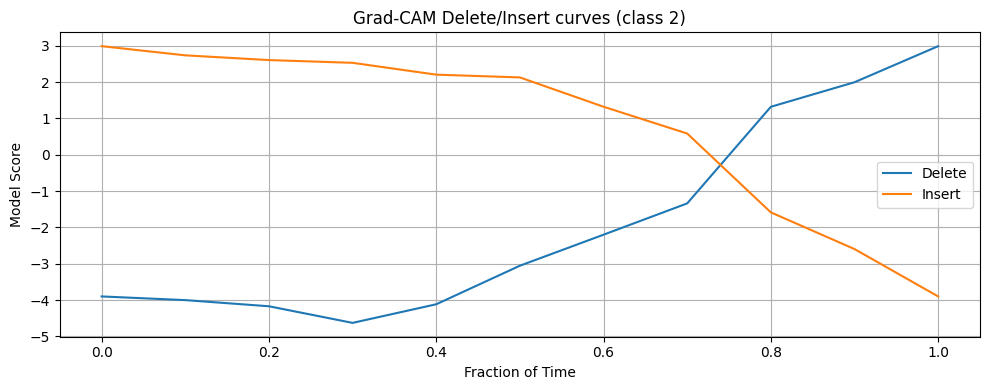

{'Energy@10%': np.float32(0.479159), 'Delete AUC': np.float64(-2.064548516273499), 'Insert AUC': np.float64(0.9460967659950259)}


In [190]:
gradcam = GradCAM1D(model, target_layer="layer3")
metrics = evaluate_gradcam_metrics(model, example_ecg, target_class, gradcam)
print(metrics)


## Other Grad-Cam methods

In [159]:
import torch
import torch.nn.functional as F
import numpy as np

# base cam
class BaseCAM1D:
    def __init__(self, model, target_layer):
        self.model = model
        self.model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

# Grad-CAM++
class GradCAMPlusPlus1D(BaseCAM1D):
    def generate_cam(self, input_tensor, target_class):
        logits, _, _ = self.model(input_tensor)
        target = logits[:, target_class]
        self.model.zero_grad()
        target.backward(retain_graph=True)

        grads = self.gradients
        activations = self.activations
        grads_power_2 = grads ** 2
        grads_power_3 = grads ** 3
        sum_activations = torch.sum(activations, dim=2, keepdim=True)

        eps = 1e-8
        alpha_denom = 2 * grads_power_2 + sum_activations * grads_power_3
        alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom) * eps)
        alphas = grads_power_2 / alpha_denom
        weights = (alphas * F.relu(grads)).sum(dim=2, keepdim=True)

        cam = (weights * activations).sum(dim=1)
        cam = F.relu(cam)
        cam = cam - cam.min(dim=-1, keepdim=True)[0]
        cam = cam / (cam.max(dim=-1, keepdim=True)[0] + 1e-8)
        return cam.squeeze().cpu().numpy()

# Smooth Grad-CAM++
class SmoothGradCAMPlusPlus1D(GradCAMPlusPlus1D):
    def __init__(self, model, target_layer, n_samples=20, noise_level=0.1):
        super().__init__(model, target_layer)
        self.n_samples = n_samples
        self.noise_level = noise_level

    def generate_cam(self, input_tensor, target_class):
        cams = []
        for _ in range(self.n_samples):
            noise = torch.randn_like(input_tensor) * self.noise_level
            noisy_input = input_tensor + noise
            cam = super().generate_cam(noisy_input, target_class)
            cams.append(cam)
        return np.mean(cams, axis=0)

# Layer-CAM
class LayerCAM1D(BaseCAM1D):
    def generate_cam(self, input_tensor, target_class):
        logits, _, _ = self.model(input_tensor)
        target = logits[:, target_class]
        self.model.zero_grad()
        target.backward()

        activations = self.activations
        grads = self.gradients
        cam = F.relu(activations * grads).sum(dim=1)
        cam = cam - cam.min(dim=-1, keepdim=True)[0]
        cam = cam / (cam.max(dim=-1, keepdim=True)[0] + 1e-8)
        return cam.squeeze().cpu().numpy()

# X-CAM
class XCAM1D(BaseCAM1D):
    def generate_cam(self, input_tensor, target_class):
        logits, _, _ = self.model(input_tensor)
        target = logits[:, target_class]
        self.model.zero_grad()
        target.backward()

        grads = self.gradients
        activations = self.activations
        weights = grads * activations
        cam = weights.sum(dim=1)
        cam = F.relu(cam)
        cam = cam - cam.min(dim=-1, keepdim=True)[0]
        cam = cam / (cam.max(dim=-1, keepdim=True)[0] + 1e-8)
        return cam.squeeze().cpu().numpy()


/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2127609597.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("Reds")


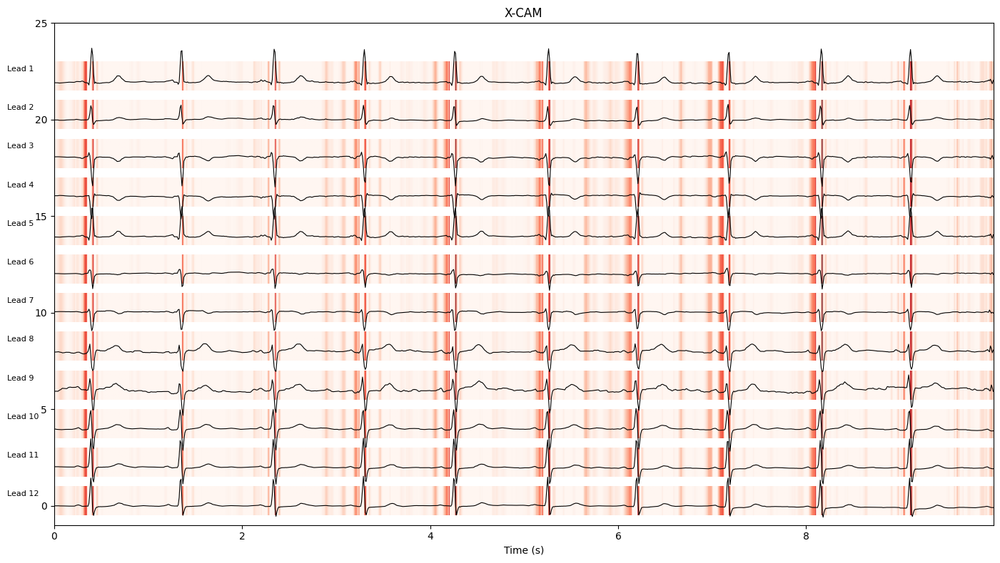

In [152]:
example_ecg = x_batch[0].unsqueeze(0).to(device)
target_class = 2
target_layer = model.encoder.layer1.conv2

cam = XCAM1D(model, target_layer)  # или GradCAM1D, GradCAMPlusPlus1D, ...
cam_map = cam.generate_cam(example_ecg, target_class)

visualize_gradcam_multilead_colormap(example_ecg, cam_map, title="X-CAM")


/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2127609597.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("Reds")


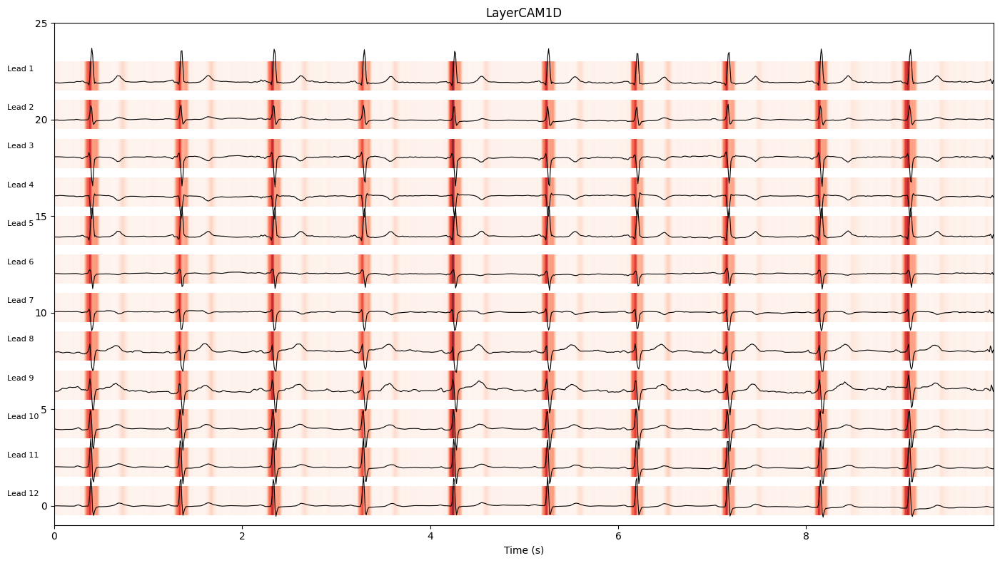

In [161]:
example_ecg = x_batch[0].unsqueeze(0).to(device)
target_class = 2
target_layer = model.encoder.layer3.conv2

cam = LayerCAM1D(model, target_layer) 
cam_map = cam.generate_cam(example_ecg, target_class)

visualize_gradcam_multilead_colormap(example_ecg, cam_map, title="LayerCAM1D")

/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2127609597.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("Reds")


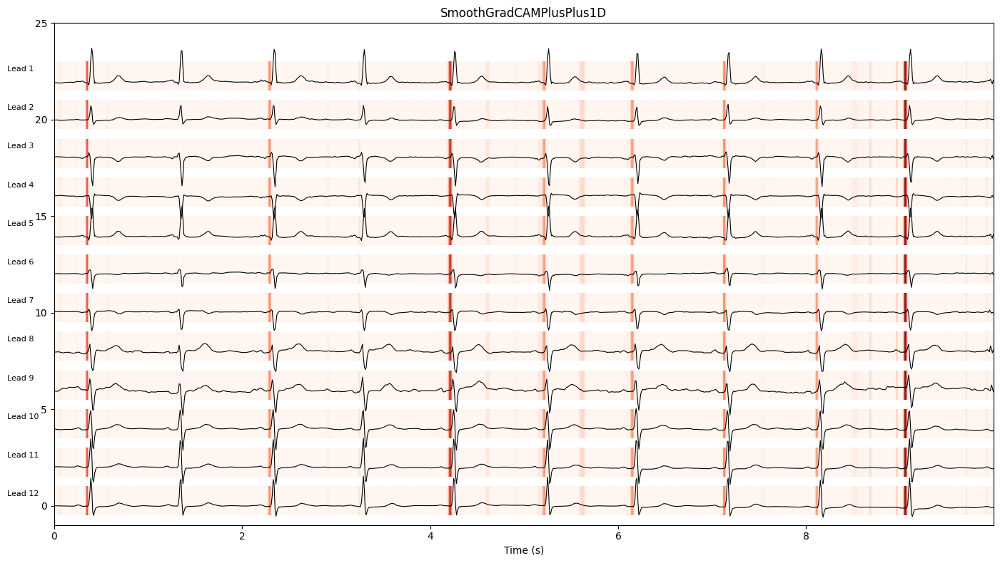

In [162]:
example_ecg = x_batch[0].unsqueeze(0).to(device)
target_class = 2
target_layer = model.encoder.layer3.conv2

cam = SmoothGradCAMPlusPlus1D(model, target_layer) 
cam_map = cam.generate_cam(example_ecg, target_class)

visualize_gradcam_multilead_colormap(example_ecg, cam_map, title="SmoothGradCAMPlusPlus1D")

## evaluation of cam methods

In [173]:
import torch
import numpy as np
from sklearn.metrics import auc

def evaluate_cam_energy(cam, topk=0.1):
    """
    cam: np.array [T]
    Возвращает долю энергии, содержащуюся в top-k% самых сильных значений CAM.
    """
    cam = cam - cam.min()
    cam = cam / (cam.max() + 1e-8)
    cam_sorted = np.sort(cam)[::-1]
    k = int(len(cam) * topk)
    topk_energy = cam_sorted[:k].sum()
    total_energy = cam.sum()
    return topk_energy / total_energy

def evaluate_delete_insert(model, input_tensor, cam, target_class, mode='delete', step=0.1):
    input_tensor = input_tensor.clone().detach()
    T = input_tensor.shape[-1]
    original_logits, _, _ = model(input_tensor)
    original_score = original_logits[0, target_class].item()

    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    indices = np.argsort(cam)[::-1].copy()  # ✅ фикс: избегаем отрицательных strides

    scores = [original_score]
    mask = torch.ones_like(input_tensor)

    for r in np.arange(step, 1.01, step):
        k = int(T * r)
        if mode == 'delete':
            mask[:, :, indices[:k]] = 0
        elif mode == 'insert':
            mask = torch.zeros_like(input_tensor)
            mask[:, :, indices[:k]] = 1

        modified = input_tensor * mask
        logits, _, _ = model(modified)
        scores.append(logits[0, target_class].item())

    x = np.linspace(0, 1, len(scores))
    return auc(x, scores)




In [174]:
import pandas as pd

def evaluate_all_cam_metrics(model, input_tensor, target_class, cam_dict):
    """
    cam_dict: {"Grad-CAM++": cam_array, ...}
    """
    results = {"Method": [], "Energy@10%": [], "Delete AUC": [], "Insert AUC": []}
    for name, cam in cam_dict.items():
        energy = evaluate_cam_energy(cam, topk=0.1)
        del_auc = evaluate_delete_insert(model, input_tensor, cam, target_class, mode='delete')
        ins_auc = evaluate_delete_insert(model, input_tensor, cam, target_class, mode='insert')

        results["Method"].append(name)
        results["Energy@10%"].append(energy)
        results["Delete AUC"].append(del_auc)
        results["Insert AUC"].append(ins_auc)

    return pd.DataFrame(results)


In [177]:

cam_methods = {
    "Grad-CAM++": GradCAMPlusPlus1D(model, target_layer),
    "Smooth Grad-CAM++": SmoothGradCAMPlusPlus1D(model, target_layer),
    "Layer-CAM": LayerCAM1D(model, target_layer),
    "X-CAM": XCAM1D(model, target_layer)
}

cam_maps = {}

for name, cam_explainer in cam_methods.items():
    cam = cam_explainer.generate_cam(example_ecg, target_class)
    cam_maps[name] = cam


df_metrics = evaluate_all_cam_metrics(model, example_ecg, target_class, cam_maps)
print(df_metrics)


/var/folders/lx/fzl2sxl10zj_j_4t3y4yp_yh0000gq/T/ipykernel_98452/2322619337.py:16: RuntimeWarning: invalid value encountered in scalar divide
  return topk_energy / total_energy
/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backwar

              Method  Energy@10%  Delete AUC  Insert AUC
0         Grad-CAM++         NaN   -0.939777   -1.170382
1  Smooth Grad-CAM++    0.995011    0.517668   -1.406159
2          Layer-CAM    0.561347    1.005186   -2.976894
3              X-CAM    0.950105   -1.060835   -1.006351


/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when 

In [186]:
import matplotlib.pyplot as plt
from scipy.stats import spearmanr
import pandas as pd
import numpy as np
import torch

def analyze_cam_results(model, input_tensor, target_class, cam_dict, gt_mask=None, threshold=0.9):
    """
    cam_dict: {"Grad-CAM++": cam_array, ...}
    input_tensor: [1, 12, T] — входной сигнал
    gt_mask: np.array length T (0/1)
    """
    
    # ======= 1. Delete & Insert Curves =======
    plt.figure(figsize=(12, 5))
    for mode in ['delete', 'insert']:
        plt.subplot(1, 2, 1 if mode == 'delete' else 2)
        for name, cam in cam_dict.items():
            cam = (cam - cam.min()) / (cam.max() + 1e-8)
            indices = np.argsort(cam)[::-1].copy()
            T = cam.shape[0]
            mask = torch.ones_like(input_tensor) if mode == 'delete' else torch.zeros_like(input_tensor)
            scores = []

            for r in np.arange(0, 1.01, 0.1):
                k = int(T * r)
                if mode == 'delete':
                    mask[:, :, indices[:k]] = 0
                else:
                    mask = torch.zeros_like(input_tensor)
                    mask[:, :, indices[:k]] = 1

                modified = input_tensor * mask
                logits, _, _ = model(modified)
                scores.append(logits[0, target_class].item())

            x = np.linspace(0, 1, len(scores))
            plt.plot(x, scores, label=name)

        plt.title(f'{mode.title()} Curve')
        plt.xlabel('Fraction of Time')
        plt.ylabel('Model Score')
        plt.legend()
        plt.grid(True)
    
    plt.suptitle(f'Delete/Insert Curves (class {target_class})')
    plt.tight_layout()
    plt.show()

    # ======= 2. Spearman correlation between CAMs =======
    df_cam = pd.DataFrame({name: cam for name, cam in cam_dict.items()})
    corr_matrix = df_cam.corr(method='spearman')
    print("\n Spearman Correlation Between CAM Maps:")
    print(corr_matrix.round(3))

    # ======= 3. IoU / Dice (если есть маска) =======
    if gt_mask is not None:
        print("\n IoU / Dice with GT mask:")
        for name, cam in cam_dict.items():
            cam = (cam - cam.min()) / (cam.max() + 1e-8)
            cam_bin = cam >= threshold
            intersection = np.logical_and(cam_bin, gt_mask).sum()
            union = np.logical_or(cam_bin, gt_mask).sum()
            dice = 2 * intersection / (cam_bin.sum() + gt_mask.sum() + 1e-8)
            iou = intersection / (union + 1e-8)
            print(f"{name:<20} IoU: {iou:.3f}   Dice: {dice:.3f}")


/Users/ana.g.orlova/Library/Python/3.9/lib/python/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


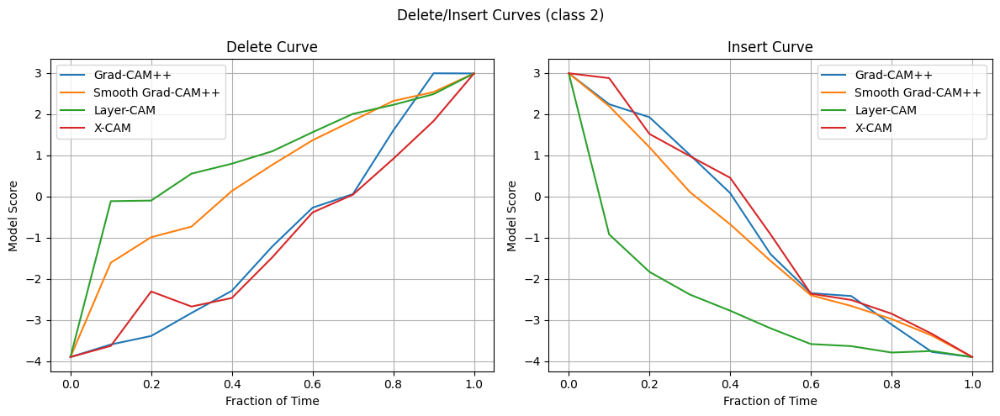


 Spearman Correlation Between CAM Maps:
                   Grad-CAM++  Smooth Grad-CAM++  Layer-CAM  X-CAM
Grad-CAM++                NaN                NaN        NaN    NaN
Smooth Grad-CAM++         NaN              1.000      0.326 -0.081
Layer-CAM                 NaN              0.326      1.000 -0.106
X-CAM                     NaN             -0.081     -0.106  1.000


In [187]:
analyze_cam_results(model, example_ecg, target_class, cam_maps)


## GRAD-CAM in details

In [ ]:
%pip install cv2

In [ ]:
%pip install opencv-python-headless

In [82]:
class GradCAM1D:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        for name, module in self.model.encoder.named_modules():
            if name == self.target_layer:
                module.register_forward_hook(self._forward_hook)
                module.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.activations = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        logits, _, _ = self.model(input_tensor)  # [B, num_classes]
        self.model.zero_grad()
        target = logits[:, class_idx]
        target.backward()

        # Compute importance weights
        pooled_gradients = torch.mean(self.gradients, dim=2)  # [B, C]

        # Weighted combination
        cam = torch.sum(self.activations * pooled_gradients.unsqueeze(-1), dim=1)  # [B, T]
        cam = F.relu(cam)
        cam = cam.squeeze().cpu().numpy()

        cam -= np.min(cam)
        cam /= np.max(cam) + 1e-6
        return cam


In [83]:
def visualize_gradcam_1d(ecg_tensor, cam, fs=100, title="ECG + Grad-CAM"):
    """
    ecg_tensor: [1, 12, T]
    cam: [T] - Grad-CAM важность
    """
    ecg = ecg_tensor.squeeze(0).cpu().numpy()  # [12, T]
    time = np.arange(ecg.shape[1]) / fs

    plt.figure(figsize=(12, 8))
    for i in range(12):
        offset = (12 - i - 1) * 2
        signal = ecg[i] + offset
        plt.plot(time, signal, color='black', linewidth=0.8)
        plt.fill_between(time, offset, signal, color='red', alpha=cam, linewidth=0.5)

    plt.title(title)
    plt.xlabel("Time (s)")
    plt.tight_layout()
    plt.show()


In [85]:
logits, _, _ = model(example_ecg)
print(logits.shape)  #  [1, num_classes]


torch.Size([1, 5])


In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2

class GradCAM:
    def __init__(self, model, target_layer):

        self.model = model
        self.target_layer = target_layer
        self.gradients = None 

        
        self._register_hooks()

    def _register_hooks(self):
        def hook_function(module, grad_in, grad_out):
            self.gradients = grad_out[0]  

      
        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_full_backward_hook(hook_function)

    def generate_cam(self, input_tensor, class_idx):
        
        
        self.model.eval()
        output = self.model(input_tensor)

        
        self.model.zero_grad()
        target = output[:, class_idx]
        target.backward() 

        
        for name, module in self.model.named_modules():
            if name == self.target_layer:
                activations = module(input_tensor).detach()
                break

       
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

 
        for i in range(activations.shape[1]):
            activations[:, i, :, :] *= pooled_gradients[i]

        heatmap = torch.mean(activations, dim=1).squeeze().cpu().numpy()
        heatmap = np.maximum(heatmap, 0) 

       
        heatmap /= np.max(heatmap)

        return heatmap

def display_grad_cam_on_ecg(model, input_ecg, class_idx, target_layer):
   
    grad_cam = GradCAM(model, target_layer)
    
   
    heatmap = grad_cam.generate_cam(input_ecg, class_idx)

    
    plt.figure(figsize=(10, 5))
    plt.plot(input_ecg.squeeze().cpu().numpy(), label="ECG Signal")
    plt.imshow(heatmap[np.newaxis, :], cmap='jet', alpha=0.6, aspect='auto')  
    plt.colorbar()
    plt.legend()
    plt.show()


In [ ]:
def display_multilead_grad_cam_on_ecg(model, input_ecg, class_idx, target_layer, fs=100):

    grad_cam = GradCAM(model, target_layer)

    #  Grad-CAM [H, W] or [C, T']
    heatmap = grad_cam.generate_cam(input_ecg.unsqueeze(0), class_idx)

   
    if heatmap.ndim == 1:
        heatmap = np.tile(heatmap[None, :], (12, 1))

  
    target_len = input_ecg.shape[-1]
    heatmap_resized = np.array([
        cv2.resize(hm[None, :], (target_len, 1), interpolation=cv2.INTER_LINEAR).squeeze()
        for hm in heatmap
    ])


    ecg_np = input_ecg.squeeze().cpu().numpy()  # [12, T]
    leads = ["I", "II", "III", "aVR", "aVL", "aVF", "V1", "V2", "V3", "V4", "V5", "V6"]
    time = np.arange(ecg_np.shape[1]) / fs


    plt.figure(figsize=(12, 8))
    for i in range(12):
        offset = (12 - i - 1) * 2
        signal = ecg_np[i] + offset
        heat = heatmap_resized[i]

   
        plt.fill_between(time, offset, signal, color='red', alpha=heat, linewidth=0.5)
        plt.plot(time, signal, color='black', linewidth=0.8)
        plt.text(-0.5, offset + 0.5, leads[i], fontsize=9)

    plt.title("Multilead ECG + Grad-CAM")
    plt.xlabel("Time (s)")
    plt.ylim(-1, 12 * 2 + 1)
    plt.xlim(time[0], time[-1])
    plt.tight_layout()
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ecg_with_gradcam_heatmap(signal, grad_cam_map, sampling_rate, title="ECG + Grad-CAM Heatmap", leads=12, attention_threshold=0.7):
    
    time = np.linspace(0, signal.shape[0] / sampling_rate, signal.shape[0])
    fig, axes = plt.subplots(leads, 1, figsize=(12, 2 * leads), sharex=True)

    for i, ax in enumerate(axes):
        ax.plot(time, signal[:, i], label=f"Lead {i+1}", color="black", linewidth=1)
        ax.set_ylabel("мВ")
        ax.legend(loc="upper right")
        ax.grid()

       
        grad_cam_rescaled = (grad_cam_map[:, i] - grad_cam_map[:, i].min()) / (grad_cam_map[:, i].max() - grad_cam_map[:, i].min() + 1e-10)

       
        pcm = ax.imshow(
            grad_cam_rescaled[np.newaxis, :],
            cmap="Reds",
            aspect="auto",
            extent=[time[0], time[-1], signal[:, i].min(), signal[:, i].max()],
            alpha=0.6,
            norm=plt.Normalize(vmin=attention_threshold, vmax=1.0)  # contrast
        )

    fig.colorbar(pcm, ax=axes, orientation="vertical", fraction=0.02, pad=0.02)
    plt.xlabel("Время (с)")
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


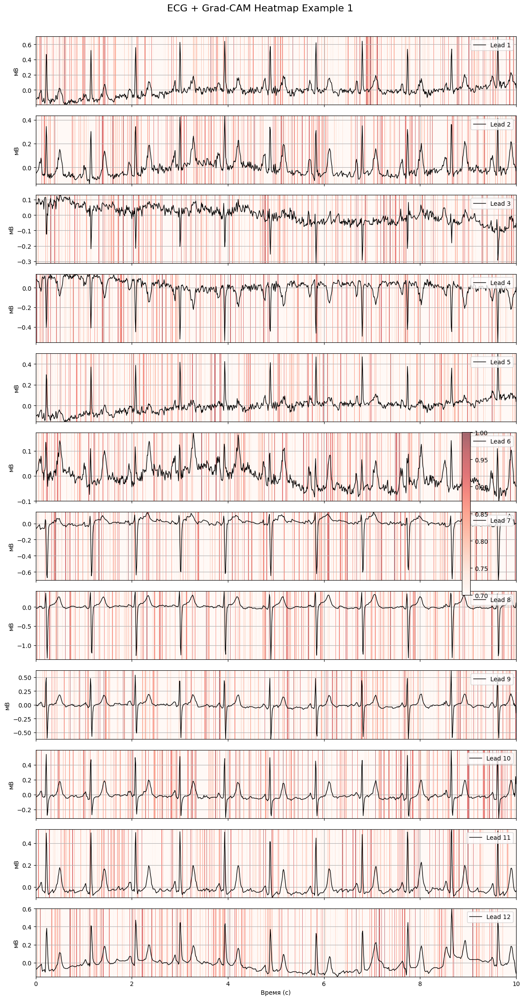

In [ ]:
example_index = 0
example_signal = X_sample[example_index]  
grad_cam_map = np.random.rand(example_signal.shape[0], 12) 

plot_ecg_with_gradcam_heatmap(
    example_signal,
    grad_cam_map,
    sampling_rate=100,
    title=f"ECG + Grad-CAM Heatmap Example {example_index+1}"
)

# Model 2

## old custom model

In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MyResidualBlock(nn.Module):
    def __init__(self, downsample=False):
        super(MyResidualBlock, self).__init__()
        self.downsample = downsample
        self.stride = 2 if self.downsample else 1
        K = 9
        P = (K - 1) // 2

        self.conv1 = nn.Conv2d(256, 256, (1, K), stride=(1, self.stride), padding=(0, P), bias=False)
        self.bn1 = nn.BatchNorm2d(256)

        self.conv2 = nn.Conv2d(256, 256, (1, K), padding=(0, P), bias=False)
        self.bn2 = nn.BatchNorm2d(256)

        if self.downsample:
            self.idfunc_0 = nn.AvgPool2d(kernel_size=(1, 2), stride=(1, 2))
            self.idfunc_1 = nn.Conv2d(256, 256, kernel_size=(1, 1), bias=False)

    def forward(self, x):
        identity = x
        x = F.leaky_relu(self.bn1(self.conv1(x)))
        x = F.leaky_relu(self.bn2(self.conv2(x)))

        if self.downsample:
            identity = self.idfunc_0(identity)
            identity = self.idfunc_1(identity)

        # Проверка на совпадение размерностей
        if x.shape != identity.shape:
            diff = abs(x.shape[-1] - identity.shape[-1])
            if x.shape[-1] > identity.shape[-1]:
                identity = F.pad(identity, (0, diff))
            else:
                x = F.pad(x, (0, diff))

        x = x + identity
        return x

class NN(nn.Module):
    def __init__(self, nOUT):
        super(NN, self).__init__()
        self.conv = nn.Conv2d(12, 256, (1, 15), padding=(0, 7), stride=(1, 1), bias=False)
        self.bn = nn.BatchNorm2d(256)

        # Уменьшаем количество блоков с downsampling
        self.rb_0 = MyResidualBlock(downsample=True)
        self.rb_1 = MyResidualBlock(downsample=False)
        self.rb_2 = MyResidualBlock(downsample=True)
        self.rb_3 = MyResidualBlock(downsample=False)

        self.mha = nn.MultiheadAttention(256, 8)
        self.pool = nn.AdaptiveMaxPool1d(output_size=1)

        self.fc_1 = nn.Linear(256, nOUT)
        self.ch_fc1 = nn.Linear(nOUT, 256)
        self.ch_bn = nn.BatchNorm1d(256)
        self.ch_fc2 = nn.Linear(256, nOUT)

    def forward(self, x):
        x = F.leaky_relu(self.bn(self.conv(x)))

        x = self.rb_0(x)
        x = self.rb_1(x)
        x = self.rb_2(x)
        x = self.rb_3(x)

        x = F.dropout(x, p=0.5, training=self.training)

        x = x.squeeze(2).permute(2, 0, 1)  # (batch, seq_len, features) для MHA
        x, _ = self.mha(x, x, x)
        x = x.permute(1, 2, 0)

        x = self.pool(x).squeeze(2)
        x = self.fc_1(x)

        p = x.detach()
        p = F.leaky_relu(self.ch_bn(self.ch_fc1(p)))
        p = torch.sigmoid(self.ch_fc2(p))
        return x, p


In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import unittest

class MyResidualBlock(nn.Module):
    def __init__(self,downsample):
        super(MyResidualBlock,self).__init__()
        self.downsample = downsample
        self.stride = 2 if self.downsample else 1
        K = 9
        P = (K-1)//2
        self.conv1 = nn.Conv2d(in_channels=256,
                               out_channels=256,
                               kernel_size=(1,K),
                               stride=(1,self.stride),
                               padding=(0,P),
                               bias=False)
        self.bn1 = nn.BatchNorm2d(256)

        self.conv2 = nn.Conv2d(in_channels=256,
                               out_channels=256,
                               kernel_size=(1,K),
                               padding=(0,P),
                               bias=False)
        self.bn2 = nn.BatchNorm2d(256)

        if self.downsample:
            self.idfunc_0 = nn.AvgPool2d(kernel_size=(1,2),stride=(1,2))
            self.idfunc_1 = nn.Conv2d(in_channels=256,
                                      out_channels=256,
                                      kernel_size=(1,1),
                                      bias=False)





    def forward(self, x):
        identity = x
        x = F.leaky_relu(self.bn1(self.conv1(x)))
        x = F.leaky_relu(self.bn2(self.conv2(x)))
        if self.downsample:
            identity = self.idfunc_0(identity)
            identity = self.idfunc_1(identity)

        x = x+identity
        return x






class NN(nn.Module):
    def __init__(self,nOUT):
        super(NN,self).__init__()
        self.conv = nn.Conv2d(in_channels=12,
                              out_channels=256,
                              kernel_size=(1,15),
                              padding=(0,7),
                              stride=(1,2),
                              bias=False)

        self.bn = nn.BatchNorm2d(256)
        self.rb_0 = MyResidualBlock(downsample=True)
        self.rb_1 = MyResidualBlock(downsample=True)
        self.rb_2 = MyResidualBlock(downsample=True)
        self.rb_3 = MyResidualBlock(downsample=True)
        self.rb_4 = MyResidualBlock(downsample=True)

        self.mha = nn.MultiheadAttention(256,8)
        self.pool = nn.AdaptiveMaxPool1d(output_size=1)

        self.fc_1 = nn.Linear(256,nOUT)

        self.ch_fc1 = nn.Linear(nOUT,256)
        self.ch_bn = nn.BatchNorm1d(256)
        self.ch_fc2 = nn.Linear(256,nOUT)

    def forward(self, x):

        x = F.leaky_relu(self.bn(self.conv(x)))

        x = self.rb_0(x)
        x = self.rb_1(x)
        x = self.rb_2(x)
        x = self.rb_3(x)
        x = self.rb_4(x)

        x = F.dropout(x,p=0.5,training=self.training)

        x = x.squeeze(2).permute(2,0,1)
        x,s = self.mha(x,x,x)
        x = x.permute(1,2,0)
        x = self.pool(x).squeeze(2)

        x = self.fc_1(x)
        p = x.detach()
        p = F.leaky_relu(self.ch_bn(self.ch_fc1(p)))
        p = torch.sigmoid(self.ch_fc2(p))
        return x,p

class test(unittest.TestCase):
    def setUp(self) -> None:
        pass
    def test_0(self):
        x = torch.rand(64,12,1,8192)
        mdl = NN(24)
        y  = mdl(x)

## training 

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

def train_model(net, train_loader, val_loader, criterion, optimizer, num_epochs=2, device="cpu"):
    
    net.to(device)

    for epoch in range(num_epochs):
        net.train() 
        running_loss = 0.0

        for i, data in enumerate(train_loader, 0):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs, _ = net(inputs) 
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            if i % 200 == 199: 
                print(f'[Epoch {epoch + 1}, Batch {i + 1:5d}] Loss: {running_loss / 200:.3f}')
                running_loss = 0.0

        
        net.eval() 
        with torch.no_grad():
            val_ap_scores = evaluate_model(net, val_loader, device=device)

        print(f'Validation AP scores after Epoch {epoch + 1}: {val_ap_scores}')

    print('Finished Training')
    return net


In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score, roc_auc_score
import numpy as np
import matplotlib.pyplot as plt

def evaluate_model(net, loader, device="cpu", num_classes=5):
    net.eval()
    all_targets = []
    all_preds = []
    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs, _ = net(inputs)
            probs = F.softmax(outputs, dim=1)
            # One-hot for multiclass => shape [batch, num_classes]
            one_hot = F.one_hot(labels.to(torch.long), num_classes=num_classes).float()
            all_targets.append(one_hot.cpu())
            all_preds.append(probs.cpu())
    all_targets = torch.cat(all_targets, dim=0).numpy()
    all_preds   = torch.cat(all_preds,   dim=0).numpy()

    ap_scores  = {}
    auc_scores = {}
    for i in range(num_classes):
        ap_scores[f'Class {i}']  = average_precision_score(all_targets[:, i], all_preds[:, i])
        try:
            auc_scores[f'Class {i}'] = roc_auc_score(all_targets[:, i], all_preds[:, i])
        except ValueError:
            auc_scores[f'Class {i}'] = float('nan')


    ap_scores['macro']  = np.nanmean(list(ap_scores.values()))
    auc_scores['macro'] = np.nanmean(list(auc_scores.values()))

    return ap_scores, auc_scores


def train_model(net, train_loader, val_loader,
                criterion, optimizer,
                num_epochs=50, device="cpu",
                patience=5):
    net.to(device)
    #  early stopping by val_auc
    best_val_auc = -np.inf
    epochs_no_improve = 0

    
    history = {
        'train_loss': [],
        'val_ap':     [],
        'val_auc':    [],
    }

    for epoch in range(1, num_epochs+1):
        net.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs, _ = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)

        epoch_loss = running_loss / len(train_loader.dataset)
        history['train_loss'].append(epoch_loss)

        
        ap_scores, auc_scores = evaluate_model(net, val_loader, device=device)
        history['val_ap'].append(ap_scores['macro'])
        history['val_auc'].append(auc_scores['macro'])

        print(f"Epoch {epoch:2d}/{num_epochs} — "
              f"Train Loss: {epoch_loss:.4f} | "
              f"Val AP (macro): {ap_scores['macro']:.4f} | "
              f"Val ROC AUC (macro): {auc_scores['macro']:.4f}")

        
        if auc_scores['macro'] > best_val_auc:
            best_val_auc = auc_scores['macro']
            epochs_no_improve = 0
            best_weights = net.state_dict()
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"EarlyStopping: нет улучшения val_auc в течение {patience} эпох.")
                break

  
    net.load_state_dict(best_weights)

    
    best_epoch = int(np.nanargmax(history['val_auc'])) + 1
    best_val   = history['val_auc'][best_epoch-1]
    print(f"\nOptimal epoch by ROC AUC: {best_epoch} (macro AUC = {best_val:.4f})")

  
    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.title('Train Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(history['val_ap'],  label='Val AP')
    plt.plot(history['val_auc'], label='Val ROC AUC')
    plt.title('Validation Metrics')
    plt.xlabel('Epoch')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return net, history


In [35]:
net = NN(nOUT=5)
criterion = nn.CrossEntropyLoss()  
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [39]:
net = train_model(net, train_loader, val_loader, criterion, optimizer, num_epochs=5, device="cpu")

[Epoch 1, Batch   200] Loss: 1.375
[Epoch 1, Batch   400] Loss: 1.309
Validation AP scores after Epoch 1: ({'Class 0': (0.7359425676259871,), 'Class 1': (0.618919274738327,), 'Class 2': (0.6833842135335823,), 'Class 3': (0.9097316841268003,), 'Class 4': (0.7213095264808411,)}, {'Class 0': 0.8662345040962783, 'Class 1': 0.8768100807574494, 'Class 2': 0.8588673539784779, 'Class 3': 0.9349926783636251, 'Class 4': 0.9035696247536957})
[Epoch 2, Batch   200] Loss: 1.287
[Epoch 2, Batch   400] Loss: 1.219
Validation AP scores after Epoch 2: ({'Class 0': (0.7528232304847687,), 'Class 1': (0.5795960599861076,), 'Class 2': (0.7271316417337704,), 'Class 3': (0.9186718442913305,), 'Class 4': (0.694281341348355,)}, {'Class 0': 0.8748686197943857, 'Class 1': 0.8889684528782273, 'Class 2': 0.8755879385158964, 'Class 3': 0.9409827441012621, 'Class 4': 0.8943529468448143})
[Epoch 3, Batch   200] Loss: 1.204
[Epoch 3, Batch   400] Loss: 1.232
Validation AP scores after Epoch 3: ({'Class 0': (0.77182943

In [28]:
def train_model(net, trainloader, criterion, optimizer, num_epochs=2, device="cpu"):
    net.to(device)
    for epoch in range(num_epochs):
        running_loss = 0.0

        for i, data in enumerate(trainloader, 0):
            inputs, labels = data
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs, _ = net(inputs)  # Используем только 'outputs', игнорируя 'p'
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            if i % 200 == 199:
                print(f'[epoch {epoch + 1}, batch {i + 1:5d}] loss: {running_loss / 200:.3f}')
                running_loss = 0.0

    print('Finished Training')
    return net


In [29]:
net = NN(nOUT=5)
criterion = nn.CrossEntropyLoss()  
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [33]:
net = train_model(net, train_loader, val_loader, criterion, optimizer, num_epochs=2, device="cpu")

[Epoch 1, Batch   200] Loss: 1.941
[Epoch 1, Batch   400] Loss: 1.502
Validation AP scores after Epoch 1: ({'Class 0': (0.5882973981116009,), 'Class 1': (0.43897348611254566,), 'Class 2': (0.6098379059426947,), 'Class 3': (0.8830274598047552,), 'Class 4': (0.6770820901092233,)}, {'Class 0': 0.8058613843123335, 'Class 1': 0.8172280190271597, 'Class 2': 0.817768074172937, 'Class 3': 0.9170663740065585, 'Class 4': 0.879630768003881})
[Epoch 2, Batch   200] Loss: 1.393
[Epoch 2, Batch   400] Loss: 1.313
Validation AP scores after Epoch 2: ({'Class 0': (0.7052923512846234,), 'Class 1': (0.5831044829783496,), 'Class 2': (0.6805723140184127,), 'Class 3': (0.9135798337948929,), 'Class 4': (0.7198520015874503,)}, {'Class 0': 0.8610154036765577, 'Class 1': 0.8802824805778617, 'Class 2': 0.8522626162981876, 'Class 3': 0.9384988704905096, 'Class 4': 0.8999552249716729})
Finished Training


## testing

In [37]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score, roc_auc_score

def evaluate_model(net, test_loader, device="cpu"):
    
    net.to(device)
    net.eval()  

    all_targets = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = net(inputs)  
            probabilities = F.softmax(outputs, dim=1)  

            all_targets.append(labels.cpu())
            all_preds.append(probabilities.cpu())

    all_targets = torch.cat(all_targets, dim=0).numpy()  
    all_preds = torch.cat(all_preds, dim=0).numpy()  

    
    ap_scores = {}
    auc_scores = {}
    for i in range(5): 
        ap_scores[f'Class {i}'] = average_precision_score(all_targets[:, i], all_preds[:, i]),
        auc_scores[f'Class {i}'] = roc_auc_score(all_targets[:, i], all_preds[:, i])

    return ap_scores, auc_scores



In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    confusion_matrix, classification_report,
    roc_auc_score, average_precision_score,
    log_loss, top_k_accuracy_score
)
from sklearn.preprocessing import label_binarize
import numpy as np

def evaluate_all_metrics(model, test_loader, num_classes=5, device="cpu"):
    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = model(inputs)
            probs = F.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())
            all_preds.append(preds.cpu())

    y_true = torch.cat(all_targets).numpy()
    y_probs = torch.cat(all_probs).numpy()
    y_pred = torch.cat(all_preds).numpy()

  
    y_true_onehot = label_binarize(y_true, classes=list(range(num_classes)))

    print(" Accuracy:", accuracy_score(y_true, y_pred))
    print("F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print(" Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print(" Recall (macro):", recall_score(y_true, y_pred, average='macro'))
    print(" Log Loss:", log_loss(y_true, y_probs))
    print(" Top-3 Accuracy:", top_k_accuracy_score(y_true, y_probs, k=3))

    print("\n Classification Report:\n", classification_report(y_true, y_pred))

    # Average Precision и ROC AUC per class
    print("\n Average Precision per class:")
    for i in range(num_classes):
        ap = average_precision_score(y_true_onehot[:, i], y_probs[:, i])
        print(f"  Class {i}: {ap:.4f}")

    print("\n ROC AUC per class:")
    for i in range(num_classes):
        auc = roc_auc_score(y_true_onehot[:, i], y_probs[:, i])
        print(f"  Class {i}: {auc:.4f}")

    print("\n Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))


In [58]:
def evaluate_all_metrics(model, test_loader, num_classes=5, device="cpu"):
    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = model(inputs)
            probs = F.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())
            all_preds.append(preds.cpu())

    y_true = torch.cat(all_targets).numpy()
    y_probs = torch.cat(all_probs).numpy()
    y_pred = torch.cat(all_preds).numpy()

    # Только для AP и ROC AUC
    from sklearn.preprocessing import label_binarize
    y_true_onehot = label_binarize(y_true, classes=list(range(num_classes)))

    # Метрики с обычными метками
    print("📊 Accuracy:", accuracy_score(y_true, y_pred))
    print("📊 F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print("📊 Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print("📊 Recall (macro):", recall_score(y_true, y_pred, average='macro'))
    print("📉 Log Loss:", log_loss(y_true, y_probs))
    print("📈 Top-3 Accuracy:", top_k_accuracy_score(y_true, y_probs, k=3))

    print("\n📊 Classification Report:\n", classification_report(y_true, y_pred))

    # AP и ROC AUC по классам
    print("\n🔥 Average Precision per class:")
    for i in range(num_classes):
        ap = average_precision_score(y_true_onehot[:, i], y_probs[:, i])
        print(f"  Class {i}: {ap:.4f}")

    print("\n🔥 ROC AUC per class:")
    for i in range(num_classes):
        auc = roc_auc_score(y_true_onehot[:, i], y_probs[:, i])
        print(f"  Class {i}: {auc:.4f}")

    print("\n🧮 Confusion Matrix:")
    print(confusion_matrix(y_true, y_pred))


In [ ]:
from sklearn.metrics import (
    accuracy_score, f1_score, precision_score, recall_score,
    roc_auc_score, average_precision_score, log_loss
)
import numpy as np

def evaluate_all_metrics_multilabel(model, test_loader, num_classes=5, device="cpu"):
    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = model(inputs)
            probs = torch.sigmoid(outputs)  #  sigmoid for multilabel
            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())

    y_true = torch.cat(all_targets).numpy()         # shape: [N, C]
    y_probs = torch.cat(all_probs).numpy()          # shape: [N, C]
    y_pred = (y_probs >= 0.5).astype(int)           

    print(" Accuracy (subset exact match):", accuracy_score(y_true, y_pred))
    print(" F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print(" Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print(" Recall (macro):", recall_score(y_true, y_pred, average='macro'))


    print("\n ROC AUC per class:")
    for i in range(num_classes):
        try:
            auc = roc_auc_score(y_true[:, i], y_probs[:, i])
            print(f"  Class {i}: {auc:.4f}")
        except ValueError:
            print(f"  Class {i}: ROC AUC — not enough samples")

    print("\n Log Loss (overall):", log_loss(y_true, y_probs))


In [68]:
def evaluate_all_metrics_multilabel(model, test_loader, num_classes=5, device="cpu"):
    from sklearn.metrics import (
        accuracy_score, f1_score, precision_score, recall_score,
        roc_auc_score, average_precision_score, log_loss
    )
    import numpy as np

    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _, _ = model(inputs)  # ✅ исправлено
            probs = torch.sigmoid(outputs)
            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())

    y_true = torch.cat(all_targets).numpy()
    y_probs = torch.cat(all_probs).numpy()
    y_pred = (y_probs >= 0.5).astype(int)

    print(" Accuracy (subset exact match):", accuracy_score(y_true, y_pred))
    print(" F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print(" Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print(" Recall (macro):", recall_score(y_true, y_pred, average='macro'))

    print("\n ROC AUC per class:")
    for i in range(num_classes):
        try:
            auc = roc_auc_score(y_true[:, i], y_probs[:, i])
            print(f"  Class {i}: {auc:.4f}")
        except ValueError:
            print(f"  Class {i}: ROC AUC — not enough samples")

    print("\n Log Loss (overall):", log_loss(y_true, y_probs))


In [42]:
evaluate_all_metrics_multilabel(net, test_loader, num_classes=5, device="cpu")

📊 Accuracy (subset exact match): 0.1486374896779521
📊 F1 Score (macro): 0.5652627681492226
📊 Precision (macro): 0.5432067234144181
📊 Recall (macro): 0.7646966498380807

🔥 Average Precision per class:
  Class 0: 0.6408
  Class 1: 0.6499
  Class 2: 0.6591
  Class 3: 0.9105
  Class 4: 0.7267

🔥 ROC AUC per class:
  Class 0: 0.8001
  Class 1: 0.8978
  Class 2: 0.8398
  Class 3: 0.9379
  Class 4: 0.9018

📉 Log Loss (overall): 1.5769068669906174


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2981: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
  warnings.warn(


In [ ]:
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from sklearn.metrics import precision_score, recall_score, f1_score

def classification_report_per_class(y_true, y_pred, class_names=None):
    n_classes = y_true.shape[1]
    if class_names is None:
        class_names = [f"Class {i}" for i in range(n_classes)]

    precision = precision_score(y_true, y_pred, average=None, zero_division=0)
    recall = recall_score(y_true, y_pred, average=None, zero_division=0)
    f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

    report = pd.DataFrame({
        'Class': class_names,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1
    })

    print(report)
    return report

def evaluate_and_report_per_class(model, test_loader, class_names, device="cpu"):
    model.to(device)
    model.eval()

    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = model(inputs)
            probs = torch.sigmoid(outputs)  # multilabel — sigmoid!

            all_targets.append(labels.cpu())
            all_probs.append(probs.cpu())

    y_true = torch.cat(all_targets).numpy()
    y_probs = torch.cat(all_probs).numpy()
    y_pred = (y_probs >= 0.5).astype(int)

    print(" Multilabel classification report per class:")
    return classification_report_per_class(y_true, y_pred, class_names=class_names)



In [ ]:
class_names = ["CD", "HYP", "MI", "NORM", "STTC"]
report_df = evaluate_and_report_per_class(net, test_loader, class_names=class_names, device="cpu")



In [81]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score, roc_auc_score

def evaluate_model(net, test_loader, device="cpu"):
    net.to(device)
    net.eval()

    all_targets = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = net(inputs)  # logits и, возможно, скрытые признаки
            probabilities = F.softmax(outputs, dim=1)

            one_hot_labels = F.one_hot(labels.long(), num_classes=probabilities.shape[1])

            all_targets.append(one_hot_labels.cpu())
            all_preds.append(probabilities.cpu())

    all_targets = torch.cat(all_targets, dim=0).numpy()
    all_preds = torch.cat(all_preds, dim=0).numpy()

    ap_scores = {}
    auc_scores = {}

    for i in range(all_preds.shape[1]):
        ap = average_precision_score(all_targets[:, i], all_preds[:, i])
        auc = roc_auc_score(all_targets[:, i], all_preds[:, i])
        ap_scores[f'Class {i}'] = ap
        auc_scores[f'Class {i}'] = auc

    # Macro-average
    ap_scores['macro'] = sum(ap_scores[f'Class {i}'] for i in range(all_preds.shape[1])) / all_preds.shape[1]
    auc_scores['macro'] = sum(auc_scores[f'Class {i}'] for i in range(all_preds.shape[1])) / all_preds.shape[1]

    return ap_scores, auc_scores


In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score, roc_auc_score

def evaluate_model(net, test_loader, device="cpu"):
    
    net.to(device)
    net.eval()

    all_targets = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = net(inputs)  
            probabilities = F.softmax(outputs, dim=1)  

            # One-hot encoding для multilabel ROC AUC / AP
            one_hot_labels = F.one_hot(labels, num_classes=probabilities.shape[1])

            all_targets.append(one_hot_labels.cpu())
            all_preds.append(probabilities.cpu())

    all_targets = torch.cat(all_targets, dim=0).numpy()
    all_preds = torch.cat(all_preds, dim=0).numpy()

    ap_scores = {}
    auc_scores = {}

    for i in range(all_preds.shape[1]):
        ap_scores[f'Class {i}'] = average_precision_score(all_targets[:, i], all_preds[:, i])
        auc_scores[f'Class {i}'] = roc_auc_score(all_targets[:, i], all_preds[:, i])

    return {
        "average_precision": ap_scores,
        "roc_auc": auc_scores
    }


In [ ]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score, roc_auc_score
import numpy as np

def evaluate_model(net, test_loader, device="cpu"):
    net.to(device)
    net.eval()

    all_targets = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs, _ = net(inputs)
            probabilities = F.softmax(outputs, dim=1)

            # преобразуем метки в one-hot
            one_hot = F.one_hot(labels.to(torch.long), num_classes=5).float()

            all_targets.append(one_hot.cpu())
            all_preds.append(probabilities.cpu())

    all_targets = torch.cat(all_targets, dim=0).numpy()
    all_preds = torch.cat(all_preds, dim=0).numpy()

    ap_scores = {}
    auc_scores = {}

    for i in range(5):
        try:
            ap = average_precision_score(all_targets[:, i], all_preds[:, i])
        except ValueError:
            ap = float('nan')
        try:
            auc = roc_auc_score(all_targets[:, i], all_preds[:, i])
        except ValueError:
            auc = float('nan')

        ap_scores[f'Class {i}'] = ap
        auc_scores[f'Class {i}'] = auc

    ap_scores['macro'] = np.nanmean(list(ap_scores.values()))
    auc_scores['macro'] = np.nanmean(list(auc_scores.values()))

    return ap_scores, auc_scores


## activation maps

### Saliency

In [ ]:
mi_mask = y_test[:, df.columns.get_loc("MI")] == 1
mi_idx = np.where(mi_mask)[0][0]
#signal = X_test[mi_idx]
#sampling_rate = record.fs if hasattr(record, 'fs') else 100 

In [ ]:
def compute_saliency_map_for_ecg(model, input_tensor, target_class):

    model.eval()
    
  
    input_tensor.requires_grad_()

    outputs, _ = model(input_tensor)
    score = outputs[0, target_class]


    model.zero_grad()
    score.backward()

    saliency = input_tensor.grad.detach().abs().squeeze().cpu().numpy()  # [12, time]
    return saliency


In [ ]:
import matplotlib.pyplot as plt

def plot_importance_map_ecg(signal, attribution, title="Attribution Map", lead=0):
    
    plt.figure(figsize=(12, 4))
    plt.plot(signal[lead], label=f'Lead {lead+1} Signal')
    plt.plot(attribution[lead], label=f'Attribution for Lead {lead+1}', alpha=0.7)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Amplitude / Importance")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


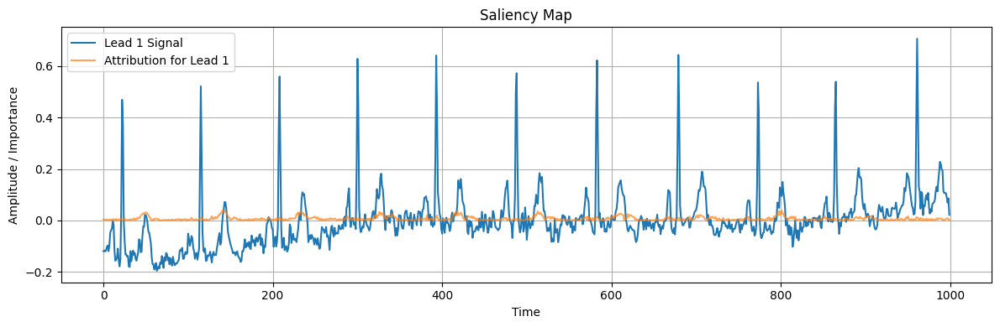

In [ ]:

sample = X_test[mi_idx]  # (1000, 12)
signal_tensor = torch.tensor(sample.T, dtype=torch.float32).unsqueeze(0).unsqueeze(2)  # -> [1, 12, 1, 1000]


net.eval()
with torch.no_grad():
    logits, _ = net(signal_tensor)
    predicted_class = torch.argmax(logits, dim=1).item()

# Saliency
saliency = compute_saliency_map_for_ecg(net, signal_tensor.clone(), predicted_class)
plot_importance_map_ecg(signal_tensor.squeeze().numpy(), saliency, title="Saliency Map", lead=0)


### Input × Gradient

In [ ]:
def compute_input_x_gradient_ecg(model, input_tensor, target_class):
  
    model.eval()

    input_tensor.requires_grad_()
    outputs, _ = model(input_tensor)
    score = outputs[0, target_class]
    
    model.zero_grad()
    score.backward()

    gradient = input_tensor.grad.detach()
    input_x_grad = (input_tensor * gradient).detach().squeeze().cpu().numpy()  # [12, time]
    return input_x_grad


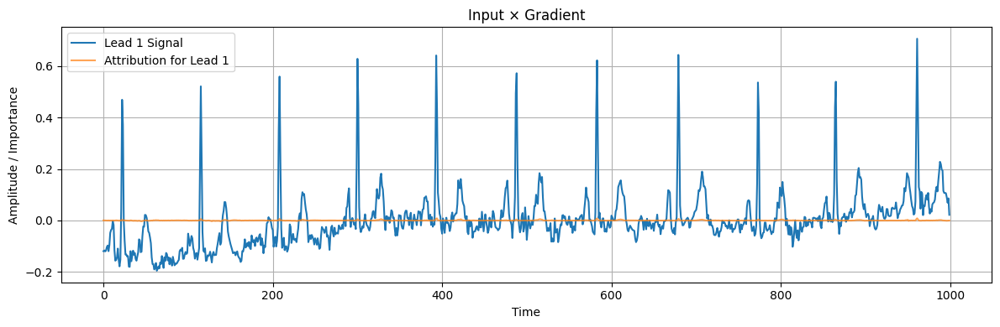

In [54]:
# Input × Gradient
ixg = compute_input_x_gradient_ecg(net, signal_tensor.clone(), predicted_class)
plot_importance_map_ecg(signal_tensor.squeeze().numpy(), ixg, title="Input × Gradient", lead=0)

### Integrated Gradients

In [ ]:
def compute_integrated_gradients_ecg(model, input_tensor, target_class, baseline=None, steps=50):
 
    model.eval()

    if baseline is None:
        baseline = torch.zeros_like(input_tensor)

    grads = []

    for alpha in torch.linspace(0, 1, steps + 1):
        interp_input = baseline + alpha * (input_tensor - baseline)
        interp_input.requires_grad_()
        outputs, _ = model(interp_input)
        score = outputs[0, target_class]
        model.zero_grad()
        score.backward()
        grads.append(interp_input.grad.detach())

    avg_grads = torch.stack(grads).mean(dim=0)
    integrated_grads = (input_tensor - baseline) * avg_grads
    return integrated_grads.detach().squeeze().cpu().numpy()  # [12, time]



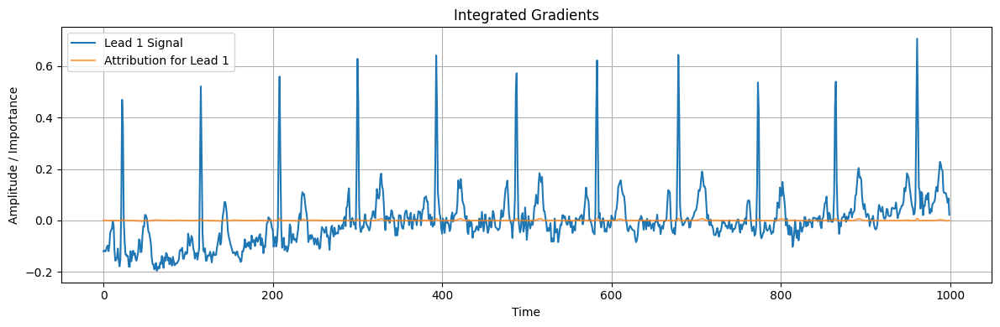

In [58]:
intgrads = compute_integrated_gradients_ecg(net, signal_tensor.clone(), predicted_class)
plot_importance_map_ecg(signal_tensor.squeeze().numpy(), intgrads, title="Integrated Gradients", lead=0)

## SHAP (DeepExplainer)
Idea: based on Shapley's theory: evaluates the contribution of each input feature to the final decision.

Pros: suitable for time series, provides global and local explanations.

In [61]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 553.5/553.5 kB 137.2 kB/s eta 0:00:00a 0:00:01

[notice] A new release of pip available: 22.3.1 -> 25.0.1
[notice] To update, run: pip3.11 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [66]:
import torch.nn as nn

class LogitsOnlyWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    
    def forward(self, x):
        logits, _ = self.model(x)
        return logits


In [ ]:
baseline_tensor = torch.tensor(X_train.mean(axis=0).T, dtype=torch.float32).unsqueeze(0).unsqueeze(2)


In [ ]:
def compute_approx_shap(model, input_tensor, target_class, baseline=None, step=50):
 
    model.eval()

    if baseline is None:
        baseline = torch.zeros_like(input_tensor)

    with torch.no_grad():
        logits = model(input_tensor)  # [1, num_classes]
        original_score = logits[0, target_class]

    shap_map = torch.zeros_like(input_tensor)

    for _ in range(step):
        mask = (torch.rand_like(input_tensor) > 0.1).float()
        masked_input = input_tensor * mask + baseline * (1 - mask)

        with torch.no_grad():
            logits = model(masked_input)
            score = logits[0, target_class]

        contrib = (original_score - score) * (1 - mask)
        shap_map += contrib

    shap_map /= step
    return shap_map.squeeze().cpu().numpy()  # [12, time]



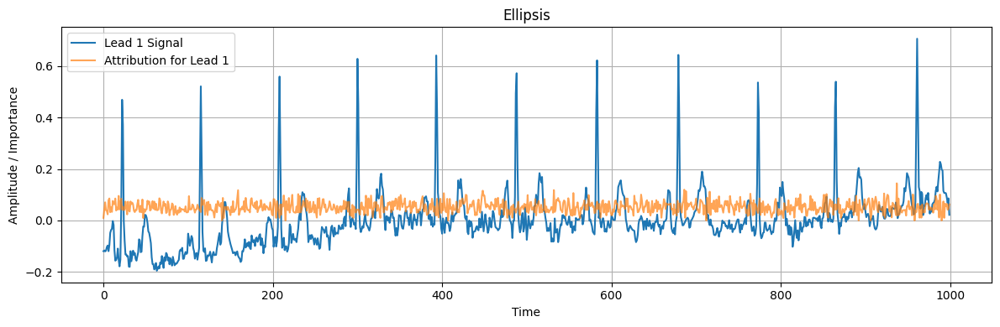

In [74]:
class LogitsOnlyWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
    def forward(self, x):
        logits, _ = self.model(x)
        return logits

wrapped_net = LogitsOnlyWrapper(net)
shap_map = compute_approx_shap(wrapped_net, signal_tensor, target_class=predicted_class)
plot_importance_map_ecg(signal_tensor.squeeze().detach().numpy(), shap_map, ...)



In [ ]:
def compute_approx_shap_advanced(model, input_tensor, target_class, baseline=None, steps=50, 
                                 mask_mode='channel', window_size=100):
 
    model.eval()

    if baseline is None:
        baseline = torch.zeros_like(input_tensor)

    with torch.no_grad():
        original_score = model(input_tensor)[0, target_class]

    shap_map = torch.zeros_like(input_tensor)

    for _ in range(steps):
        mask = torch.ones_like(input_tensor)

        if mask_mode == 'channel':
            for ch in range(input_tensor.shape[1]):
                if torch.rand(1).item() < 0.3:
                    mask[0, ch, :, :] = 0.0

        elif mask_mode == 'window':
            start = torch.randint(0, input_tensor.shape[-1] - window_size, (1,)).item()
            end = start + window_size
            mask[:, :, :, start:end] = 0.0

        masked_input = input_tensor * mask + baseline * (1 - mask)

        with torch.no_grad():
            score = model(masked_input)[0, target_class]

        contribution = (original_score - score) * (1 - mask)
        shap_map += contribution

    shap_map /= steps
    return shap_map.squeeze().cpu().numpy()  # [12, time]


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_readable_heatmap_attribution_all_leads(signal, attribution, title="Approx SHAP (by Leads)"):
   
    if hasattr(attribution, 'detach'):
        attribution = attribution.detach().cpu().numpy()
    if attribution.ndim == 3:
        attribution = attribution.squeeze()

    plt.figure(figsize=(14, 6))
    
   
    mean_importance = np.mean(np.abs(attribution), axis=1, keepdims=True)
    normalized = mean_importance / np.max(mean_importance) 

    sns.heatmap(
        normalized,
        cmap="RdBu_r",
        annot=True,
        fmt=".2f",
        xticklabels=False,
        yticklabels=[f"Lead {i+1}" for i in range(12)],
        linewidths=0.5,
        linecolor='gray',
        cbar_kws={"label": "Normalized Importance"}
    )

    plt.title(title, fontsize=14, weight='bold')
    plt.xlabel("Time", fontsize=12)
    plt.ylabel("Leads", fontsize=12)
    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_heatmap_attribution_all_leads(signal, attribution, title="Attribution Heatmap (12 leads)"):
  
    plt.figure(figsize=(16, 6))

    if attribution.ndim == 3:
        attribution = attribution.squeeze()

    sns.heatmap(
        attribution,
        cmap="coolwarm",
        xticklabels=100,
        yticklabels=[f"Lead {i+1}" for i in range(12)],
        cbar_kws={'label': 'Importance'}
    )
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Leads")
    plt.tight_layout()
    plt.show()


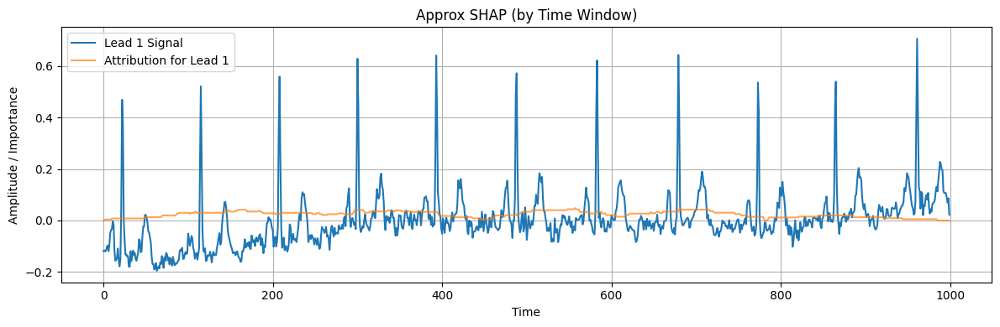

In [79]:
shap_windows = compute_approx_shap_advanced(wrapped_net, signal_tensor, predicted_class,
                                            mask_mode='window', steps=50, window_size=100)
plot_importance_map_ecg(signal_tensor.squeeze().detach().numpy(), shap_windows, 
                        title="Approx SHAP (by Time Window)", lead=0)


## GradCam

In [43]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import cv2

class GradCAM:
    def __init__(self, model, target_layer):

        self.model = model
        self.target_layer = target_layer
        self.gradients = None 

        
        self._register_hooks()

    def _register_hooks(self):
        def hook_function(module, grad_in, grad_out):
            self.gradients = grad_out[0]  

      
        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_full_backward_hook(hook_function)

    def generate_cam(self, input_tensor, class_idx):
        
        
        self.model.eval()
        output = self.model(input_tensor)

        
        self.model.zero_grad()
        target = output[:, class_idx]
        target.backward() 

        
        for name, module in self.model.named_modules():
            if name == self.target_layer:
                activations = module(input_tensor).detach()
                break

       
        pooled_gradients = torch.mean(self.gradients, dim=[0, 2, 3])

 
        for i in range(activations.shape[1]):
            activations[:, i, :, :] *= pooled_gradients[i]

        heatmap = torch.mean(activations, dim=1).squeeze().cpu().numpy()
        heatmap = np.maximum(heatmap, 0) 

       
        heatmap /= np.max(heatmap)

        return heatmap

def display_grad_cam_on_ecg(model, input_ecg, class_idx, target_layer):
   
    grad_cam = GradCAM(model, target_layer)
    
   
    heatmap = grad_cam.generate_cam(input_ecg, class_idx)

    
    plt.figure(figsize=(10, 5))
    plt.plot(input_ecg.squeeze().cpu().numpy(), label="ECG Signal")
    plt.imshow(heatmap[np.newaxis, :], cmap='jet', alpha=0.6, aspect='auto')  
    plt.colorbar()
    plt.legend()
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ecg_with_gradcam_heatmap(signal, grad_cam_map, sampling_rate, title="ECG + Grad-CAM Heatmap", leads=12, attention_threshold=0.7):
    """
    Visualization of Grad-CAM.
    
    attention_threshold: float –  (0.0–1.0)
    """
    time = np.linspace(0, signal.shape[0] / sampling_rate, signal.shape[0])
    fig, axes = plt.subplots(leads, 1, figsize=(12, 2 * leads), sharex=True)

    for i, ax in enumerate(axes):
        ax.plot(time, signal[:, i], label=f"Lead {i+1}", color="black", linewidth=1)
        ax.set_ylabel("мВ")
        ax.legend(loc="upper right")
        ax.grid()

       
        grad_cam_rescaled = (grad_cam_map[:, i] - grad_cam_map[:, i].min()) / (grad_cam_map[:, i].max() - grad_cam_map[:, i].min() + 1e-10)

       
        pcm = ax.imshow(
            grad_cam_rescaled[np.newaxis, :],
            cmap="Reds",
            aspect="auto",
            extent=[time[0], time[-1], signal[:, i].min(), signal[:, i].max()],
            alpha=0.6,
            norm=plt.Normalize(vmin=attention_threshold, vmax=1.0) 
        )

    fig.colorbar(pcm, ax=axes, orientation="vertical", fraction=0.02, pad=0.02)
    plt.xlabel("Время (с)")
    fig.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


/var/folders/yh/__krj9vj03703dshgqrk6hqm0000gn/T/ipykernel_5621/1105914554.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.97])


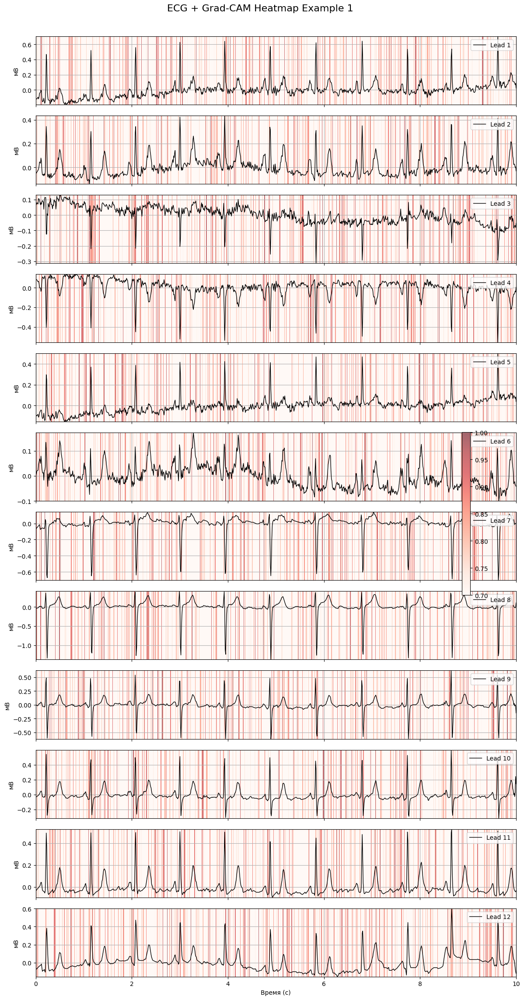

In [ ]:
example_index = 0
example_signal = X_sample[example_index]  
grad_cam_map = np.random.rand(example_signal.shape[0], 12) 

plot_ecg_with_gradcam_heatmap(
    example_signal,
    grad_cam_map,
    sampling_rate=100,
    title=f"ECG + Grad-CAM Heatmap Example {example_index+1}"
)


## GradCam ++

In [46]:
class SmoothGradCAMpp:
    def __init__(self, model, target_layer, n_samples=25, noise_level=0.1):
        self.model = model
        self.target_layer = target_layer
        self.n_samples = n_samples
        self.noise_level = noise_level
        self.gradients = None
        self._register_hooks()

    def _register_hooks(self):
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_full_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        grads_list = []
        activations = None

        for _ in range(self.n_samples):
            noise = torch.randn_like(input_tensor) * self.noise_level
            noisy_input = input_tensor + noise
            output = self.model(noisy_input)
            target = output[:, class_idx]
            self.model.zero_grad()
            target.backward(retain_graph=True)

            for name, module in self.model.named_modules():
                if name == self.target_layer:
                    acts = module(noisy_input).detach()
                    if activations is None:
                        activations = acts
            grads_list.append(self.gradients.detach())

        grads = torch.stack(grads_list).mean(dim=0)
        pooled_gradients = torch.mean(grads, dim=2)
        for i in range(activations.shape[1]):
            activations[:, i, :] *= pooled_gradients[:, i].unsqueeze(1)

        heatmap = torch.mean(activations, dim=1).squeeze().cpu().numpy()
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap) + 1e-8
        return heatmap


## ScoreCAM

In [47]:
class ScoreCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_forward_hook(forward_hook)

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        _ = self.model(input_tensor)
        activations = self.activations  # [B, C, T]
        B, C, T = activations.shape
        input_tensor = input_tensor.detach()

        weights = []
        for i in range(C):
            upsampled = F.interpolate(activations[:, i:i+1, :], size=input_tensor.shape[2], mode='linear', align_corners=False)
            masked_input = input_tensor * upsampled
            score = self.model(masked_input)[:, class_idx]
            weights.append(score.detach().cpu().item())

        weights = torch.tensor(weights).view(1, -1, 1)
        weighted_activations = activations * weights.to(activations.device)
        heatmap = torch.sum(weighted_activations, dim=1).squeeze().cpu().numpy()
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap) + 1e-8
        return heatmap


## XGradCAM

In [48]:
class XGradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_forward_hook(forward_hook)
                module.register_full_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        output = self.model(input_tensor)
        target = output[:, class_idx]
        self.model.zero_grad()
        target.backward(retain_graph=True)

        weights = torch.sum(self.gradients * self.activations, dim=2, keepdim=True) / (self.activations.shape[2] + 1e-8)
        cam = torch.sum(weights * self.activations, dim=1).squeeze().cpu().numpy()
        cam = np.maximum(cam, 0)
        cam /= np.max(cam) + 1e-8
        return cam


## LayerCAM

In [49]:
class LayerCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        for name, module in self.model.named_modules():
            if name == self.target_layer:
                module.register_forward_hook(forward_hook)
                module.register_full_backward_hook(backward_hook)

    def generate_cam(self, input_tensor, class_idx):
        self.model.eval()
        output = self.model(input_tensor)
        target = output[:, class_idx]
        self.model.zero_grad()
        target.backward(retain_graph=True)

        cam = F.relu(self.activations * self.gradients)
        cam = torch.sum(cam, dim=1).squeeze().cpu().numpy()
        cam = cam - cam.min()
        cam /= cam.max() + 1e-8
        return cam


## Visualization of gras-cam methods

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_ecg_with_attention_map(signal, attention_map, sampling_rate, title="ECG + Attention Map", leads=12, attention_threshold=0.7, method_name="CAM"):

    time = np.linspace(0, signal.shape[0] / sampling_rate, signal.shape[0])
    fig, axes = plt.subplots(leads, 1, figsize=(12, 2 * leads), sharex=True)

    for i, ax in enumerate(axes):
        ax.plot(time, signal[:, i], label=f"Lead {i+1}", color="black", linewidth=1)
        ax.set_ylabel("мВ")
        ax.legend(loc="upper right")
        ax.grid()

        # normalization 
        attention_rescaled = (attention_map[:, i] - attention_map[:, i].min()) / (attention_map[:, i].max() - attention_map[:, i].min() + 1e-10)

        pcm = ax.imshow(
            attention_rescaled[np.newaxis, :],
            cmap="Reds",
            aspect="auto",
            extent=[time[0], time[-1], signal[:, i].min(), signal[:, i].max()],
            alpha=0.6,
            norm=plt.Normalize(vmin=attention_threshold, vmax=1.0)
        )

    fig.colorbar(pcm, ax=axes, orientation="vertical", fraction=0.02, pad=0.02)
    plt.xlabel("Время (с)")
    fig.suptitle(f"{title} — {method_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()


/var/folders/yh/__krj9vj03703dshgqrk6hqm0000gn/T/ipykernel_1151/855974519.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.97])


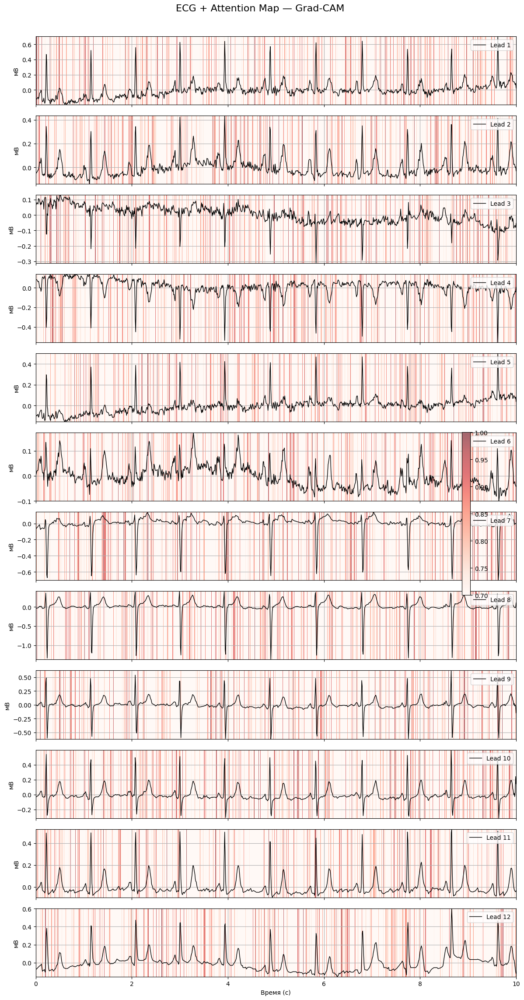

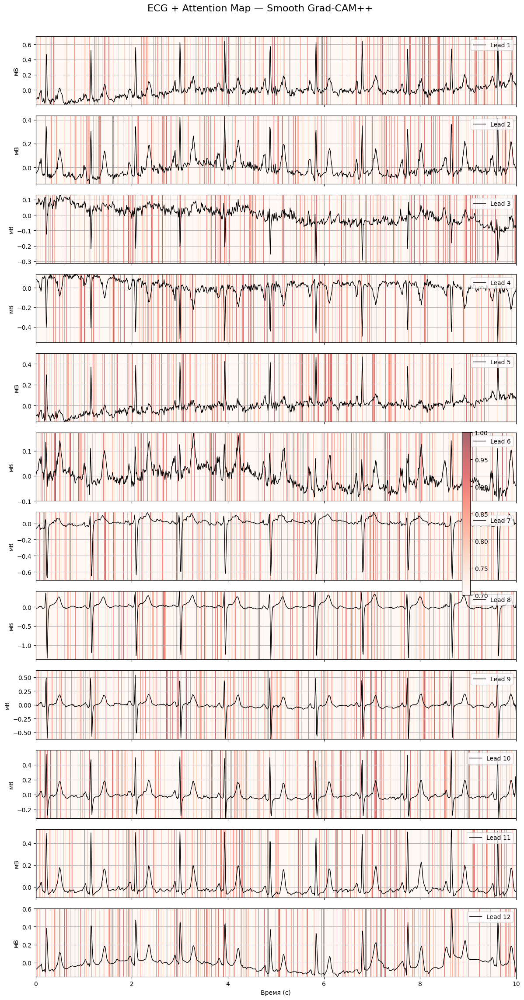

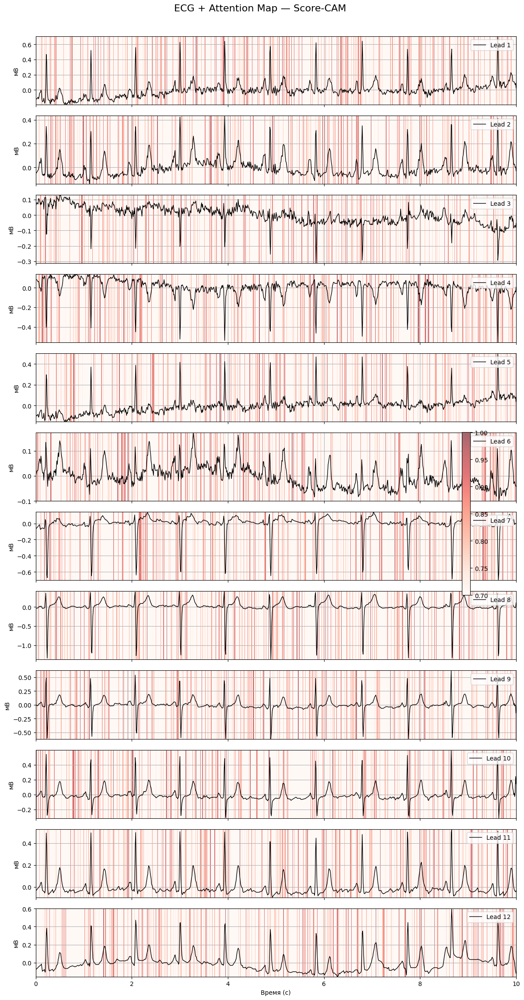

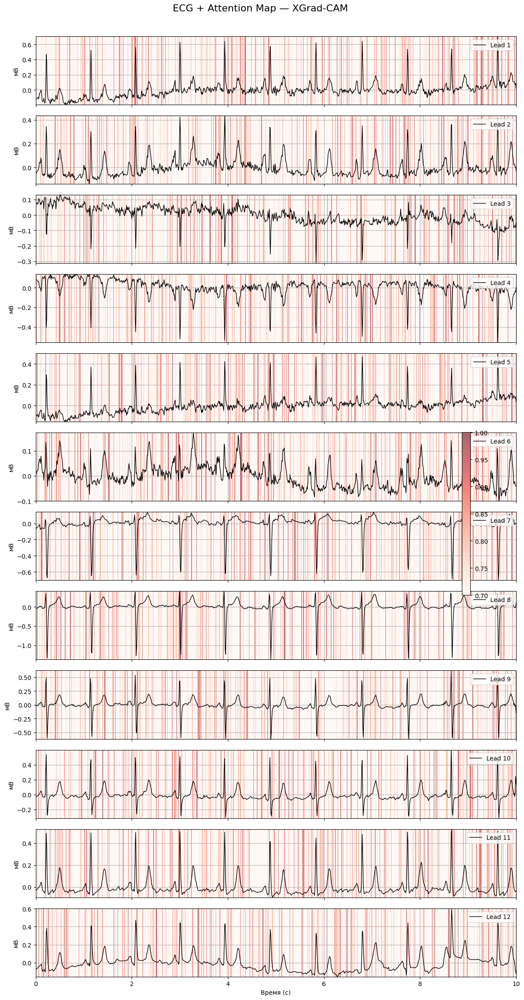

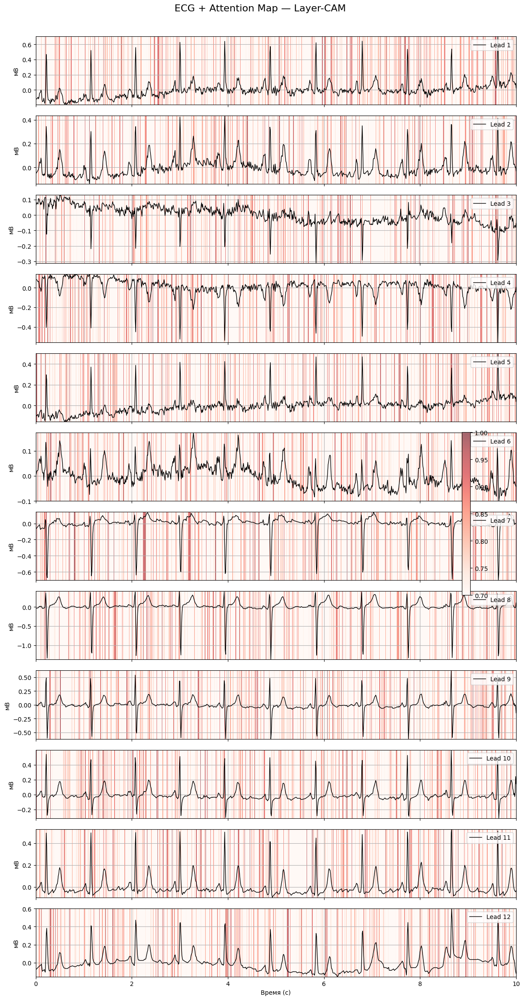

In [ ]:
example_index = 0
signal = X_sample[example_index]  # ECG: [time, 12]

attention_map_gradcam = np.random.rand(*signal.shape)        # Grad-CAM
attention_map_smooth = np.random.rand(*signal.shape)         # Smooth Grad-CAM++
attention_map_score = np.random.rand(*signal.shape)          # Score-CAM
attention_map_xgrad = np.random.rand(*signal.shape)          # XGrad-CAM
attention_map_layer = np.random.rand(*signal.shape)          # Layer-CAM

plot_ecg_with_attention_map(signal, attention_map_gradcam, sampling_rate=100, method_name="Grad-CAM")
plot_ecg_with_attention_map(signal, attention_map_smooth,  sampling_rate=100, method_name="Smooth Grad-CAM++")
plot_ecg_with_attention_map(signal, attention_map_score,   sampling_rate=100, method_name="Score-CAM")
plot_ecg_with_attention_map(signal, attention_map_xgrad,   sampling_rate=100, method_name="XGrad-CAM")
plot_ecg_with_attention_map(signal, attention_map_layer,   sampling_rate=100, method_name="Layer-CAM")


/var/folders/yh/__krj9vj03703dshgqrk6hqm0000gn/T/ipykernel_5621/2324925842.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.97])


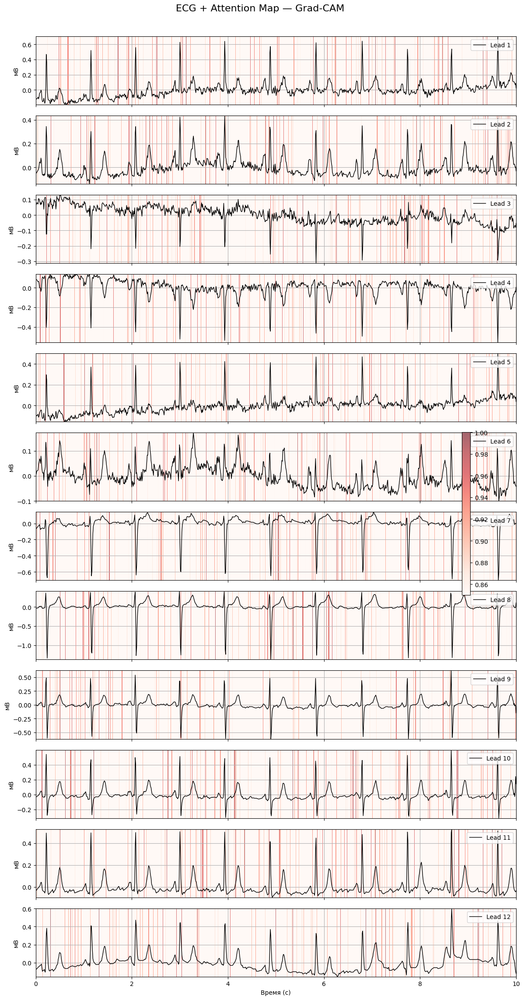

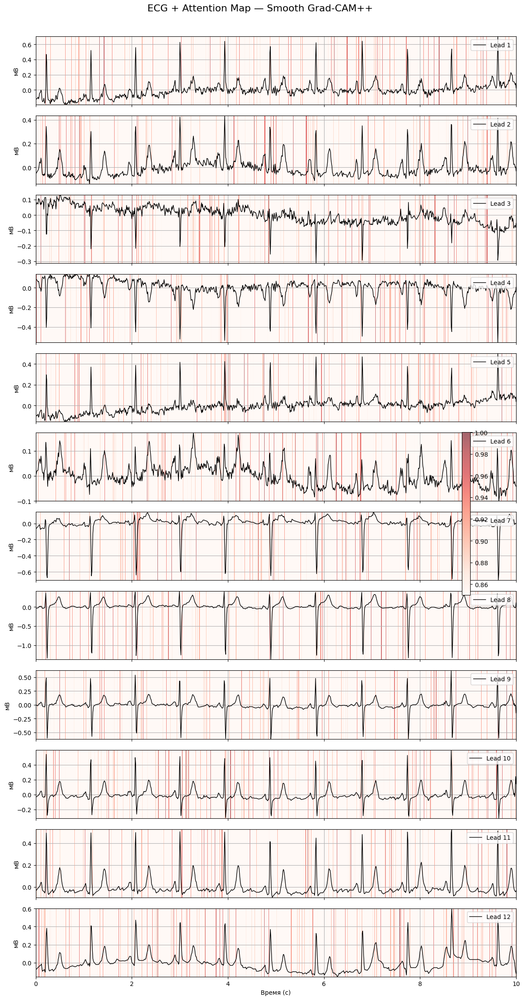

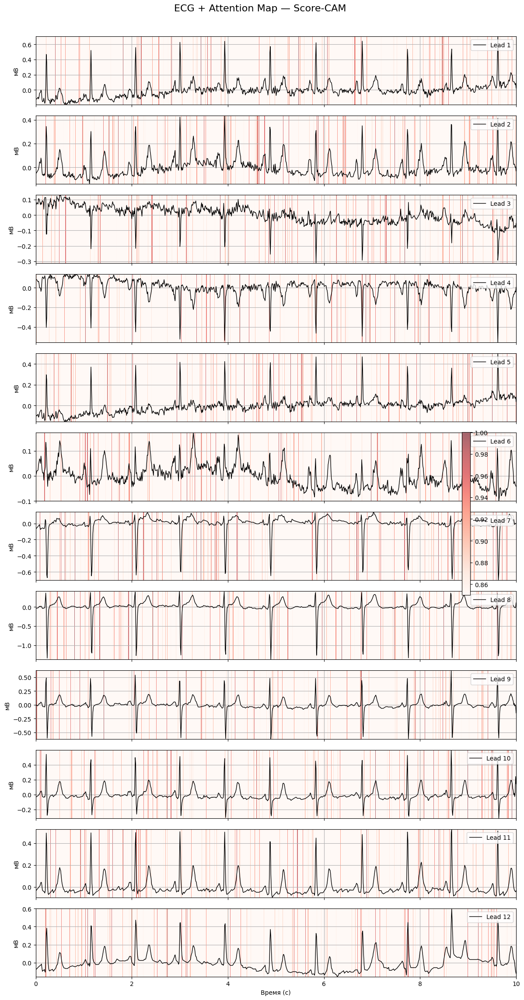

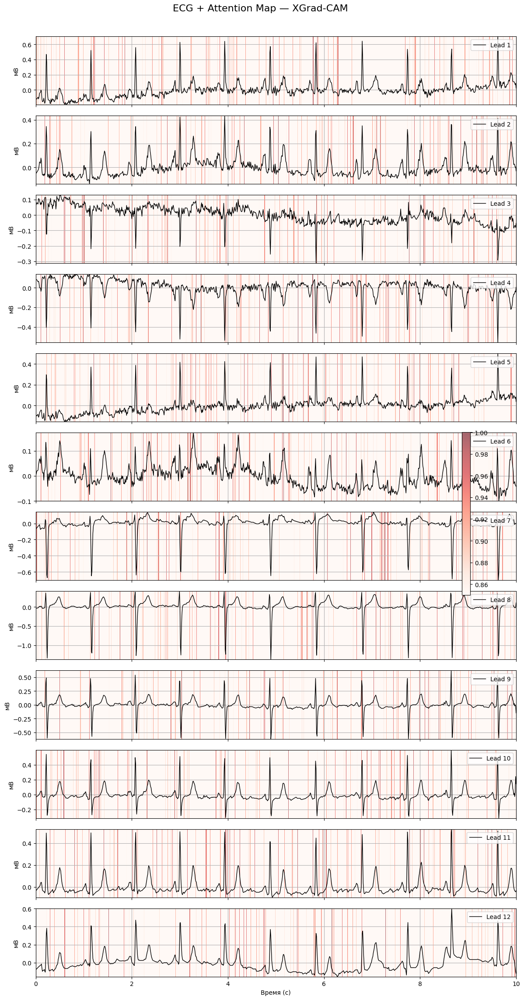

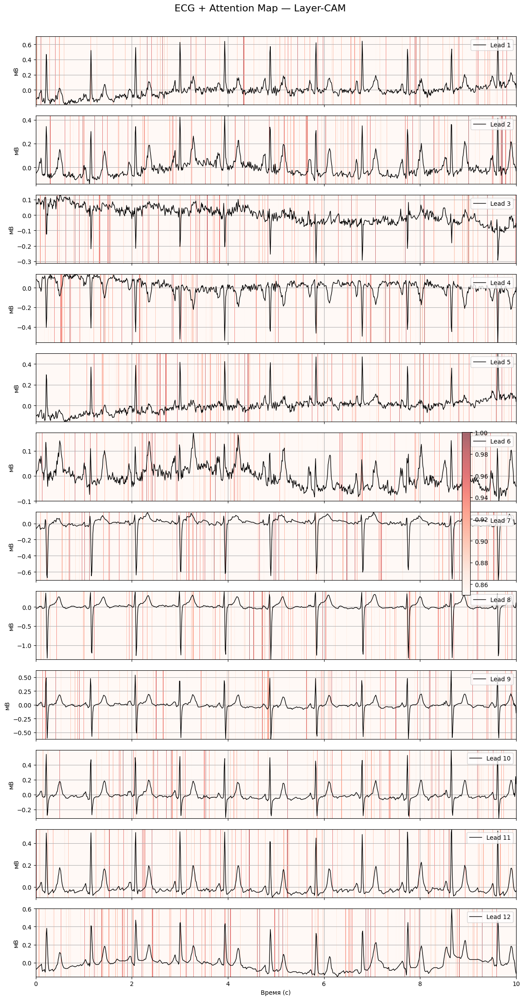

In [ ]:
def plot_ecg_with_attention_map(signal, attention_map, sampling_rate, title="ECG + Attention Map", leads=12, attention_threshold=0.85, method_name="CAM"):
    time = np.linspace(0, signal.shape[0] / sampling_rate, signal.shape[0])
    fig, axes = plt.subplots(leads, 1, figsize=(12, 2 * leads), sharex=True)

    for i, ax in enumerate(axes):
        ax.plot(time, signal[:, i], label=f"Lead {i+1}", color="black", linewidth=1)
        ax.set_ylabel("мВ")
        ax.legend(loc="upper right")
        ax.grid()

        
        attention_rescaled = (attention_map[:, i] - attention_map[:, i].min()) / (attention_map[:, i].max() - attention_map[:, i].min() + 1e-10)

        pcm = ax.imshow(
            attention_rescaled[np.newaxis, :],
            cmap="Reds",
            aspect="auto",
            extent=[time[0], time[-1], signal[:, i].min(), signal[:, i].max()],
            alpha=0.6,
            norm=plt.Normalize(vmin=attention_threshold, vmax=1.0)
        )

    fig.colorbar(pcm, ax=axes, orientation="vertical", fraction=0.02, pad=0.02)
    plt.xlabel("Время (с)")
    fig.suptitle(f"{title} — {method_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.97])
    plt.show()



mi_mask = y_test[:, df.columns.get_loc("MI")] == 1
mi_idx = np.where(mi_mask)[0][0]
signal = X_test[mi_idx]
sampling_rate = record.fs if hasattr(record, 'fs') else 100 


attention_map_gradcam = np.random.rand(*signal.shape)
attention_map_smooth  = np.random.rand(*signal.shape)
attention_map_score   = np.random.rand(*signal.shape)
attention_map_xgrad   = np.random.rand(*signal.shape)
attention_map_layer   = np.random.rand(*signal.shape)


plot_ecg_with_attention_map(signal, attention_map_gradcam, sampling_rate=sampling_rate, method_name="Grad-CAM")
plot_ecg_with_attention_map(signal, attention_map_smooth,  sampling_rate=sampling_rate, method_name="Smooth Grad-CAM++")
plot_ecg_with_attention_map(signal, attention_map_score,   sampling_rate=sampling_rate, method_name="Score-CAM")
plot_ecg_with_attention_map(signal, attention_map_xgrad,   sampling_rate=sampling_rate, method_name="XGrad-CAM")
plot_ecg_with_attention_map(signal, attention_map_layer,   sampling_rate=sampling_rate, method_name="Layer-CAM")
